In [1]:
import numpy as np
import matplotlib as mpl
import matplotlib.path as mpath
from matplotlib import rc
import matplotlib.pyplot as plt
import netCDF4 as nc 
import pandas as pd 
import xarray as xr
from xgcm import Grid
from os.path import join,expanduser
import ecco_v4_py as ecco
import seaborn as sns
import tensorflow as tf
import scipy.io
import time
import warnings
import matplotlib.colors as colors
import dask
import statsmodels.api as sm
from pyDOE import *
import matplotlib.animation as animation
from IPython.display import HTML
from functools import partial
import sys
import plotly.graph_objects as go

np.random.seed(4321)
tf.set_random_seed(4321)
print('all done')
%matplotlib inline

/home/wc4720/.conda/envs/tf114/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/wc4720/.conda/envs/tf114/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/wc4720/.conda/envs/tf114/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/wc4720/.conda/envs/tf114/lib/python3.7/site-packages

all done


In [2]:
# LOADING IN ECCO GRID + DATA

grid_path = '/projects/SOCCOM/datasets/ecco/Version4/Release4/nctiles_grid/'
ecco_grid = xr.open_dataset(grid_path+'ECCO-GRID.nc')

ds = xr.Dataset()
tags = ['THETA','SALT','EVEL', 'NVEL', 'WVELMASS', 'OBP','SSH','PHIHYD','RHOAnoma'] # used to be PHIHYDcR
    
for i in range(1992,1993):
    for tag in tags:
        with dask.config.set(**{'array.slicing.split_large_chunks': True}):
            data_path = '/projects/SOCCOM/datasets/ecco/Version4/Release4/nctiles_monthly/'+tag+'/' + str(i) +'/'+tag+'_' + str(i) + '_??.nc'
            dsnow = xr.open_mfdataset(data_path,chunks="auto",data_vars='minimal',coords='minimal', compat='override') 
            ds = xr.merge([ds, dsnow])
#             print('done with '+tag)
    print('the year ' + str(i) + ' is loaded')
ds = xr.merge([ds, ecco_grid])

# # make the XGCM object
xgcm_grid = ecco.get_llc_grid(ds)

WVELMASS_interp = xgcm_grid.interp(ds.WVELMASS, "Z", boundary='fill')
ds = xr.merge([ds, WVELMASS_interp.rename('WVELMASS_interp')])

# with warnings.catch_warnings():
#     warnings.simplefilter("ignore")
#     vel_interp = xgcm_grid.interp_2d_vector({'X':ds.Um_dPHdx,'Y':ds.Vm_dPHdy},boundary='extend')
# Um_dPHdx_interp = vel_interp['X']
# Vm_dPHdy_interp = vel_interp['Y']
# # Um_dPHdx_interp = xgcm_grid.interp(ds.Um_dPHdx, 'X', boundary='extend')
# ds = xr.merge([ds, Um_dPHdx_interp.rename('Um_dPHdx_interp'), Vm_dPHdy_interp.rename('Vm_dPHdy_interp')])

ds

the year 1992 is loaded


<xarray.Dataset>
Dimensions:          (k: 50, j: 90, i: 90, tile: 13, time: 12, nv: 2, k_l: 50, k_p1: 51, j_g: 90, i_g: 90, k_u: 50)
Coordinates: (12/41)
  * k                (k) int64 0 1 2 3 4 5 6 7 8 ... 41 42 43 44 45 46 47 48 49
  * j                (j) int64 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
  * i                (i) int64 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
  * tile             (tile) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    XC               (tile, j, i) float32 -111.6 -111.3 -110.9 ... -105.6 -111.9
    YC               (tile, j, i) float32 -88.24 -88.38 -88.52 ... -88.08 -88.1
    ...               ...
    hFacS            (k, tile, j_g, i) float32 ...
    hFacC            (k, tile, j, i) float32 ...
    hFacW            (k, tile, j, i_g) float32 ...
    maskW            (k, tile, j, i_g) bool ...
    maskC            (k, tile, j, i) bool ...
    maskS            (k, tile, j_g, i) bool ...
Dimensions without coordinates: nv
Data variables:
    THETA            (time, k, tile, j, i) float32 dask.array<chunksize=(1, 50, 13, 90, 90), meta=np.ndarray>
    SALT             (time, k, tile, j, i) float32 dask.array<chunksize=(1, 50, 13, 90, 90), meta=np.ndarray>
    EVEL             (time, k, tile, j, i) float32 dask.array<chunksize=(1, 50, 13, 90, 90), meta=np.ndarray>
    NVEL             (time, k, tile, j, i) float32 dask.array<chunksize=(1, 50, 13, 90, 90), meta=np.ndarray>
    WVELMASS         (time, k_l, tile, j, i) float32 dask.array<chunksize=(1, 50, 13, 90, 90), meta=np.ndarray>
    OBP              (time, tile, j, i) float32 dask.array<chunksize=(1, 13, 90, 90), meta=np.ndarray>
    SSH              (time, tile, j, i) float32 dask.array<chunksize=(1, 13, 90, 90), meta=np.ndarray>
    PHIHYD           (time, k, tile, j, i) float32 dask.array<chunksize=(1, 50, 13, 90, 90), meta=np.ndarray>
    RHOAnoma         (time, k, tile, j, i) float32 dask.array<chunksize=(1, 50, 13, 90, 90), meta=np.ndarray>
    WVELMASS_interp  (time, k, tile, j, i) float32 dask.array<chunksize=(1, 49, 13, 90, 90), meta=np.ndarray>

In [5]:
# # LOADING IN U AND V TENDENCIES

tags = ['Um_dPHdx','Vm_dPHdy'] # used to be PHIHYDcR
    
for i in range(1992,1993):
    for tag in tags:
        with dask.config.set(**{'array.slicing.split_large_chunks': True}):
            data_path = '/projects/SOCCOM/datasets/ecco/Version4/Release4/nctiles_monthly/'+tag+'/' + str(i) +'/'+tag+'_' + str(i) + '_??.nc'
            dsnow = xr.open_mfdataset(data_path,chunks="auto",data_vars='minimal',coords='minimal', compat='override') 
            ds = xr.merge([ds, dsnow])
#             print('done with '+tag)
    print('the year ' + str(i) + ' is loaded')
    
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    vel_interp = xgcm_grid.interp_2d_vector({'X':ds.Um_dPHdx,'Y':ds.Vm_dPHdy},boundary='extend')
Um_dPHdx_interp = vel_interp['X']
Vm_dPHdy_interp = vel_interp['Y']
# Um_dPHdx_interp = xgcm_grid.interp(ds.Um_dPHdx, 'X', boundary='extend')
ds = xr.merge([ds, Um_dPHdx_interp.rename('Um_dPHdx_interp'), Vm_dPHdy_interp.rename('Vm_dPHdy_interp')])

# # throwaway = ds.Z.isel(k=slice(*k_ind)).values[coords_val[:,1],np.newaxis] # get depth coordinates
# # throwaway = throwaway.reshape(new_size)
# # throwaway = throwaway*-9.81
# # throwaway

# # inputs_train[:,-1].shape

# ds.PHIHYD.where(ds.maskC).isel(tile=4,time=0,k=k_ind[0],j=slice(*j_ind),i=slice(*i_ind)).plot(x='i',y='j',cmap='RdYlBu_r')
# plt.show()

# rescaled = (inputs_val[:,-1] + 1)*char_val[-1] + lb_val[-1]
# plt.imshow(rescaled.reshape(new_size)[0,0,:,:])
# plt.colorbar()

the year 1992 is loaded


In [89]:
# calculate pressure gradients (using PHIHYD instead of PHIHYDcR)
lat = ds.YC
Omega = (2*np.pi)/86164
lat_rad = (np.pi/180)*lat    # convert latitude from degrees to radians
f = 2*Omega*np.sin(lat_rad)

ds = ds.drop_vars(["UGEO", "VGEO","UGEO2","VGEO2"])
DPDX = (xgcm_grid.diff(ds.PHIHYDcR.where(ds.maskC),axis="X",boundary='extend'))/ds.dxC # 1/rho p_x
DPDY = (xgcm_grid.diff(ds.PHIHYDcR.where(ds.maskC),axis="Y",boundary='extend'))/ds.dyC # 1/rho p_y
press_grads_interp = xgcm_grid.interp_2d_vector({"X":DPDX,"Y":DPDY},boundary='extend')
DPDX = press_grads_interp['X']/f
DPDY = press_grads_interp['Y']/f
ds = xr.merge([ds, DPDX.rename('UGEO'), DPDY.rename('VGEO')],compat='override')

In [4]:
tile_ind = (3,4)
k_ind = (20,22)
j_ind = (70,90)
i_ind = (70,90)
ds.OBP.isel(tile=slice(*tile_ind),j=slice(*j_ind),i=slice(*i_ind)).where(ds.maskC.isel(k=slice(*k_ind))).values.shape

(12, 1, 20, 20, 2)

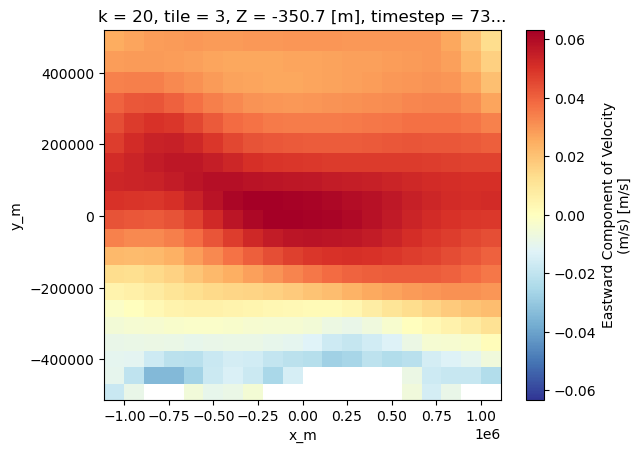

In [22]:
# # # training dataset
# tile_ind = (3,4)
# k_ind = (20,22)
# j_ind = (70,90)
# i_ind = (70,90)

# # dx = ds.dxC.isel(tile=slice(*tile_ind),j=slice(*j_ind),i_g=slice(*i_ind))
# # dy = ds.dyC.isel(tile=slice(*tile_ind),j_g=slice(*j_ind),i=slice(*i_ind))

dx = ds.XC.isel(tile=slice(*tile_ind),j=slice(*j_ind),i=slice(*i_ind))*111.32*1000
dy = ds.YC.isel(tile=slice(*tile_ind),j=slice(*j_ind),i=slice(*i_ind))*111.32*1000

# assuming latitude lines are 111.32 km wide and f is constant (f-plane)

# # rescaling to m instead of deg
# # dx = dx*111.32*1000
# # dy = dy*111.32*1000

# # shift to become centered 
dx = dx-((dx.max() -dx.min())/2+dx.min())
dy = dy-((dy.max() -dy.min())/2+dy.min())

# dx.max

# ds_new = ds.where(ds.maskC).isel(tile=slice(*tile_ind),j=slice(*j_ind),i=slice(*i_ind),k=slice(*k_ind))
ds_new = ds_new.assign_coords({"x_m": dx})
ds_new = ds_new.assign_coords({"y_m": dy})
# ds_new
ds_new.EVEL.isel(time=0,k=0).plot(x='x_m',y='y_m',cmap='RdYlBu_r')
# plt.show()


In [3]:
# DATA PREPROCESSING (with Navier Stokes normalization)

# gets the index of the array for each dimension before flattening
def using_multiindex(A, columns):
    shape = A.shape
    index = pd.MultiIndex.from_product([range(s) for s in shape], names=columns)
    df = pd.DataFrame({'A': A.flatten()}, index=index).reset_index()
    return df

def make_nninputs(ds, tags, tile_ind, time_ind, depth_ind, j_ind, i_ind, N_train):
    # ds is the main ecco data array
    # tags is a list of strings corresponding to the input variables i.e. ['THETA','SALT', ...]
        # first tagged variable must be in 4d, others can be in 3d
    # tile_ind, depth_ind, j_ind, and i_ind are tuples for subsetted data
    # N_train is a number between 0 and 100 describing percentage of data sampled
    # returns inputs_nn which is an array of all the training data of size N points x [time, depth, lat, lon, tags...]
    # returns coords_nn which is an array of all the training data coordinates of size N points x [time, k, j, i]
    
    subset_template = ds[tags[0]].isel(tile=slice(*tile_ind),time=slice(*time_ind),k=slice(*depth_ind),j=slice(*j_ind),i=slice(*i_ind)).where(ds.maskC)
    # assuming that only one tile is chosen (OTHERWISE WILL HAVE TO CHANGE CODE)
    inputs_nn = using_multiindex(subset_template.squeeze().values, ['time', 'k', 'j', 'i']) # makes array N x 5 [time, k, j, i, *first tag*]
    inputs_nn = inputs_nn.to_numpy()
    if N_train < 100: # for validation data no need to scramble coordinates
        N_train = int(N_train/100*len(inputs_nn[:,0]))
        train_idx = np.random.choice(len(inputs_nn[:,0]), N_train, replace=False) # Generate a random sample from np.arange(N*T) of size N_train
    else: 
        train_idx = range(len(inputs_nn[:,0]))
    inputs_nn = inputs_nn[train_idx,:] # subsample the training data
    coords_nn = inputs_nn[:,0:4].astype(int) # makes the time,kji indices integers for future use
    inputs_nn = inputs_nn[:,4:] # trim array by cutting out coordinates
    
    for tag in tags:
        if len(ds[tag].shape) == 5: # it is 3d + time + tile dim
            throwaway = ds[tag].where(ds.maskC).isel(tile=slice(*tile_ind),time=slice(*time_ind),k=slice(*depth_ind),j=slice(*j_ind),i=slice(*i_ind)).squeeze().values.flatten()[train_idx,np.newaxis]
            inputs_nn = np.concatenate((inputs_nn, throwaway),axis=1)
        elif len(ds[tag].shape) == 4: # it is 2d + time + tile dim
            # throwaway = ds[tag].isel(tile=slice(*tile_ind),j=slice(*j_ind),i=slice(*i_ind)).where(ds.maskC.isel(k=slice(*depth_ind))).values
            throwaway = ds[tag].isel(tile=slice(*tile_ind),j=slice(*j_ind),i=slice(*i_ind)).where(ds.maskC).values
            # throwaway[:,:,:,:,1:None]=np.nan # all the subsurface values become nan
            throwaway = throwaway.squeeze().flatten()[train_idx,np.newaxis]
            inputs_nn = np.concatenate((inputs_nn, throwaway),axis=1)
            
            # should OBP be on the bottom instead of the surface value?
            
    inputs_nn = inputs_nn[:,1:] # need to remove the first dummy variable
    
    # assuming that only one tile is chosen (OTHERWISE WILL HAVE TO CHANGE CODE)
    throwaway = ds.XC.isel(tile=slice(*tile_ind),j=slice(*j_ind),i=slice(*i_ind))[0,coords_nn[:,2],coords_nn[:,3]].values[1,:].reshape(len(train_idx),1) # get lon coordinates and scale to position
    inputs_nn = np.concatenate((throwaway*111.32*1000,inputs_nn),axis=1)
    # if tile is flipped (evel not uvel), need values[1,:] for YC and values[:,1] for XC
    throwaway = ds.YC.isel(tile=slice(*tile_ind),j=slice(*j_ind),i=slice(*i_ind))[0,coords_nn[:,2],coords_nn[:,3]].values[:,1].reshape(len(train_idx),1) # get lat coordinates and scale to position
    f_nn = 2*(2*np.pi)/86164*np.sin(throwaway*np.pi/180)
    # inputs_nn[:,0:1] = np.cos(throwaway*np.pi/180)*inputs_nn[:,0:1] # scaling the longitude length by latitude where lon = cos(lat)*lon(equator)
    inputs_nn = np.concatenate((throwaway*111.32*1000,inputs_nn),axis=1)
    throwaway = ds.Z.isel(k=slice(*depth_ind)).values[coords_nn[:,1],np.newaxis] # get depth coordinates
    inputs_nn = np.concatenate((throwaway,inputs_nn),axis=1)
    # throwaway = throwaway*-9.81 # get the hydrostatic pressure
    # inputs_nn[:,-1:] = throwaway + inputs_nn[:,-1:] # add it to the pressure anomaly
    throwaway = ds.timestep.isel(time=slice(*time_ind)).values[coords_nn[:,0],np.newaxis]*3600
    inputs_nn = np.concatenate((throwaway,inputs_nn),axis=1)

    # normalize by characteristic scales
#     mean_nn = np.nanmean(inputs_nn,axis=0)
#     std_nn = np.nanstd(inputs_nn,axis=0)
#     inputs_nn = (inputs_nn - mean_nn)/std_nn

    lb_nn = np.nanmin(inputs_nn,axis=0)
    char_nn = (np.nanmax(inputs_nn,axis=0)-lb_nn)/2
    inputs_nn = (inputs_nn-lb_nn)/char_nn - 1
    
    # get rid of the nans after calculating mean + std
    inputs_nn[np.isnan(inputs_nn)] = 0
                                   
    return subset_template, inputs_nn, coords_nn, char_nn, lb_nn, f_nn

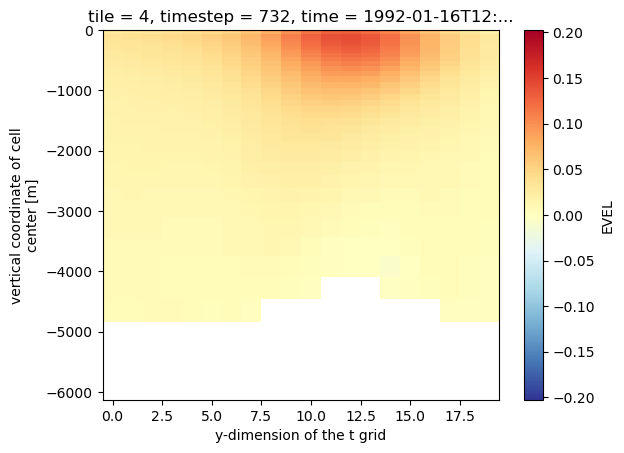

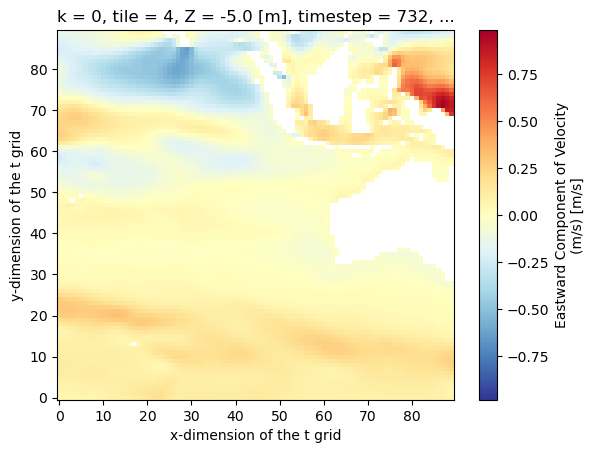

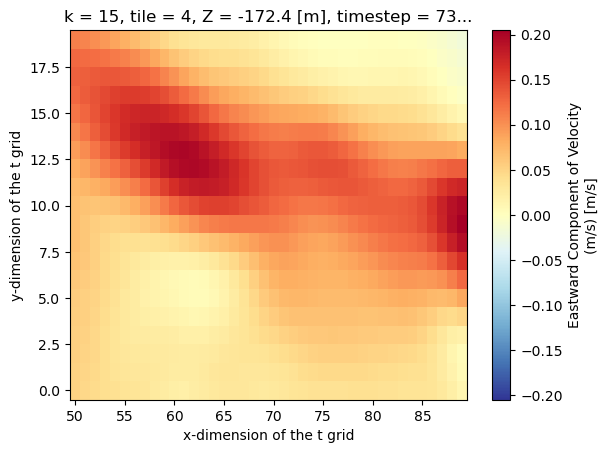

In [44]:
# MAKE TESTING, VALIDATION, AND TRAINING DATA

tags = ['THETA','SALT','OBP', 'SSH', 'EVEL', 'NVEL','WVELMASS_interp','PHIHYD','RHOAnoma']

# # training dataset (OLD)
# tile_ind = (3,4)
# k_ind = (20,22)
# j_ind = (70,90)
# i_ind = (70,90)

# tile_ind = (4,5)
time_ind = (0,12)
# k_ind = (20,24)
# j_ind = (30,50)
# i_ind = (30,50)

tile_ind = (4,5)
k_ind = (15,25)
j_ind = (0,20) #should be 90
i_ind = (50,90) #should be 40

# with dask.config.set(**{'array.slicing.split_large_chunks': True}):
#     _, inputs_train, coords_train, char_train, lb_train,_ = make_nninputs(ds,tags, tile_ind, time_ind, k_ind, j_ind, i_ind, 5)
# print('training dataset is processed!')

# plot the whole tile + training area
# ds.EVEL.where(ds.maskC).isel(tile=tile_ind[0],time=0,k=slice(0,20)).mean('i').plot(x='j',y='Z',cmap='RdYlBu_r')
# plt.show()
ds.EVEL.where(ds.maskC).isel(tile=tile_ind[0],time=0,j=slice(*j_ind),i=slice(*i_ind)).mean('i').plot(x='j',y='Z',cmap='RdYlBu_r')
plt.show()
ds.EVEL.where(ds.maskC).isel(tile=slice(*tile_ind),time=0,k=0).plot(x='i',y='j',cmap='RdYlBu_r')
plt.show()
ds.EVEL.where(ds.maskC).isel(tile=slice(*tile_ind),j=slice(*j_ind),i=slice(*i_ind),time=0,k=k_ind[0]).plot(x='i',y='j',cmap='RdYlBu_r')
plt.show()

# # validation dataset
# with dask.config.set(**{'array.slicing.split_large_chunks': True}):
#     subset_template, inputs_val, coords_val, char_val, lb_val, f_val = make_nninputs(ds,tags, tile_ind, time_ind, k_ind, j_ind, i_ind,100) 
# print('validation dataset is processed!')

# # # # plot the validation area
# # # ds.EVEL.where(ds.maskC).isel(tile=slice(*tile_ind),j=slice(*j_ind),i=slice(*i_ind),time=0,k=k_ind[0]).plot(x='i',y='j',cmap='RdYlBu_r')
# # # plt.show()

In [13]:
# # making the collocation points 

nCol = int(inputs_val.shape[0])
lb = -np.ones((8,)) # 6 inputs - time, z, y, x, T, S, OBP, SSH
ub = np.ones((8,))
col_train = lb + (ub-lb)*lhs(8, nCol)
throwaway = (col_train[:,2]+1)*char_train[2] + lb_train[2]
f_col = 2*(2*np.pi)/86164*np.sin(throwaway*np.pi/180)
f_col = f_col.reshape((f_col.shape[0],1)).astype('float32')


In [58]:
for i in range(0,110,10):
    print(i)

0
10
20
30
40
50
60
70
80
90
100


In [8]:
# sort the collocation points into their closest values in the uniform grid

def find_nearest_indices(target_values, array):
    """Find the indices of the nearest values in the array for each target value."""
    differences = np.abs(array - target_values[:, np.newaxis])
    nearest_indices = np.argmin(differences, axis=1)
    return nearest_indices

# find nearest index in the regular grid for the coordinates
nearest_indices = np.empty_like(col_train[:,0:4])
for i in range(4):
    target_values = col_train[:,i]
    array_to_search = np.unique(inputs_val[:,i])
    nearest_indices[:,i] = find_nearest_indices(target_values, array_to_search)

chosen_depth_ind = 0
chosen_time_ind = 0
depth_good = np.where(nearest_indices[:,1] == chosen_depth_ind)[0]
time_good = np.where(nearest_indices[:,0] == chosen_time_ind)[0]
plot_col_ind = np.intersect1d(depth_good, time_good)

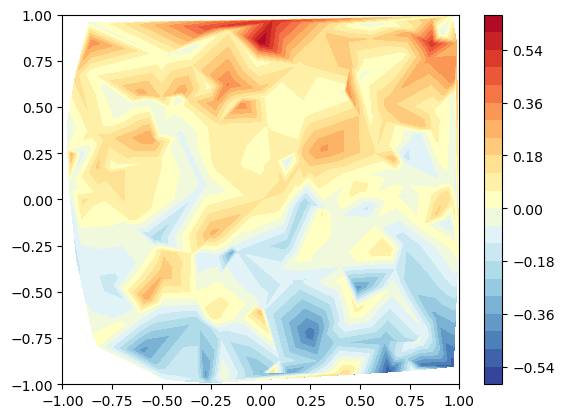

In [35]:
# find the points nearest to the depth level and time we are plotting
#create regular grid
# xi, yi = np.meshgrid(np.unique(col_train[:,3]), np.unique(col_train[:,2]))

#interpolate missing data
# rbf = scipy.interpolate.Rbf(col_train[plot_col_ind,3], col_train[plot_col_ind,2], u_predictions[0][plot_col_ind].squeeze(), function='linear')
# zi = rbf(xi,yi)
                     
# from scipy.interpolate import griddata
# grid_z0 = griddata(col_train[plot_col_ind,2:4], u_predictions[0][plot_col_ind].squeeze(), (yi, xi), method='nearest')

# Note that scipy.interpolate provides means to interpolate data on a grid
# as well. The following would be an alternative to the four lines above:
# from scipy.interpolate import griddata
# zi = griddata((x, y), z, (xi[None, :], yi[:, None]), method='linear')


fig, ax2 = plt.subplots()

cntr2 = ax2.tricontourf(col_train[plot_col_ind,3], col_train[plot_col_ind,2], u_predictions[11][plot_col_ind].squeeze(), levels=20,cmap='RdYlBu_r')
fig.colorbar(cntr2, ax=ax2)
ax2.set(xlim=(-1, 1), ylim=(-1, 1))

plt.subplots_adjust(hspace=0.5)
plt.show()

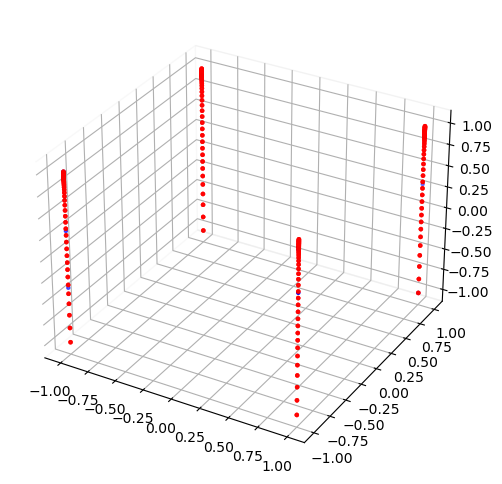

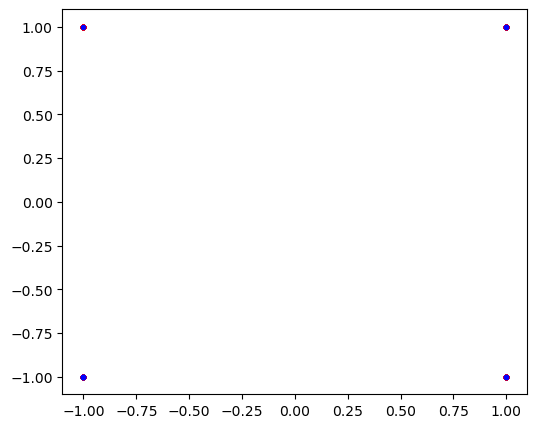

In [32]:
# Create a 3D scatter plot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False
# ax.scatter(col_train[:,3], col_train[:,2], col_train[:,1], c='g', marker='.', alpha=0.2)
ax.scatter(inputs_train[:,3], inputs_train[:,2], inputs_train[:,1], c='b', marker='.')
ax.scatter(inputs_val[:,3], inputs_val[:,2], inputs_val[:,1], c='r', marker='.', alpha=0.2)
plt.show()

fig = plt.figure(figsize=(6, 5))
ax = fig.add_subplot()
# ax.scatter(col_train[:,3], col_train[:,2], c='g', marker='.', alpha=0.2)
ax.scatter(inputs_val[:,3], inputs_val[:,2], c='r', marker='.')
ax.scatter(inputs_train[:,3], inputs_train[:,2], c='b', marker='.')
plt.show()

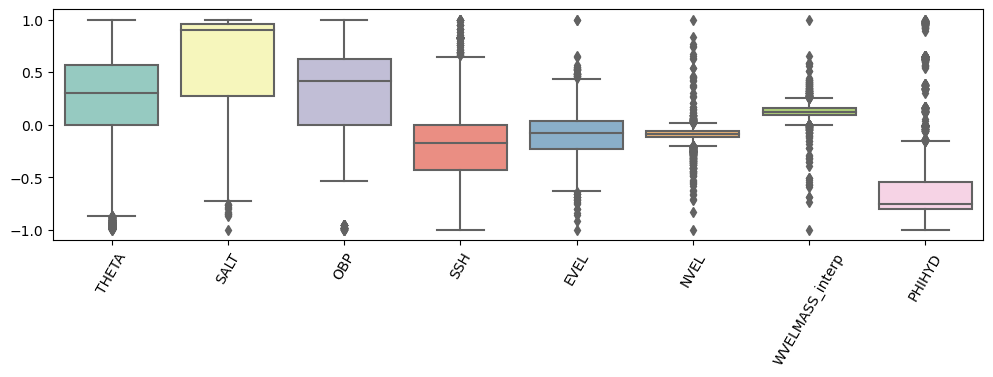

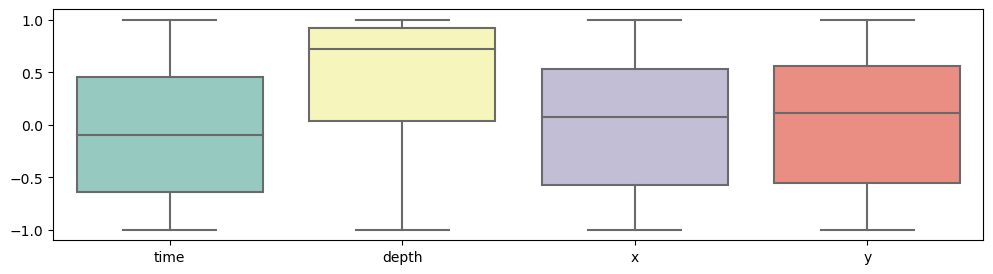

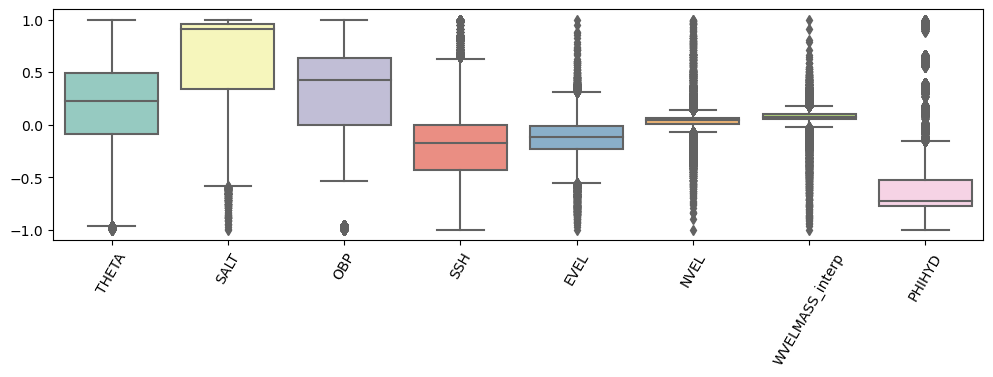

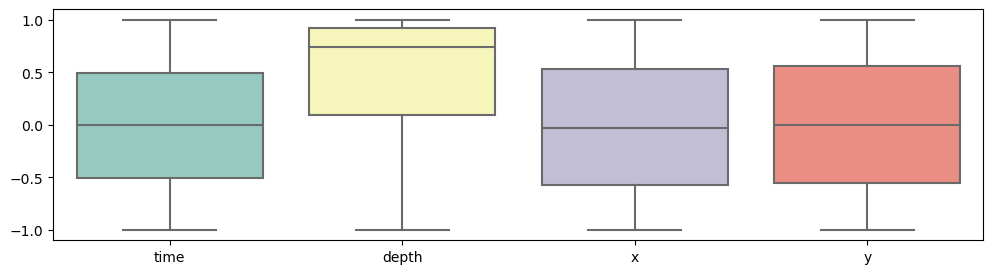

In [67]:
# # plot the normalized version of the training data

# tags = ['THETA','SALT','EVEL', 'NVEL', 'WVELMASS_interp', 'OBP','PHIHYD','SSH']
tags = ['THETA','SALT','OBP', 'SSH', 'EVEL', 'NVEL','WVELMASS_interp','PHIHYD']

fig, ax = plt.subplots(1, 1, figsize=(12,3))
ax = sns.boxplot(data=inputs_train[:,4:12], palette="Set3")
_ = ax.set_xticklabels(tags, rotation=60)
plt.show()
fig, ax = plt.subplots(1, 1, figsize=(12,3))
ax = sns.boxplot(data=inputs_train[:,0:4], palette="Set3")
_ = ax.set_xticklabels(['time','depth','x','y'], rotation=0)
plt.show()

# plot the normalized version of the validation data as well to make sure distributions match

fig, ax = plt.subplots(1, 1, figsize=(12,3))
ax = sns.boxplot(data=inputs_val[:,4:12], palette="Set3")
_ = ax.set_xticklabels(tags, rotation=60)
plt.show()
fig, ax = plt.subplots(1, 1, figsize=(12,3))
ax = sns.boxplot(data=inputs_val[:,0:4], palette="Set3")
_ = ax.set_xticklabels(['time','depth','x','y'], rotation=0)
plt.show()

In [14]:
class PhysicsInformedNN:
    # Initialize the class
    
    def __init__(self, inputs_nn, char_nn, lb_nn, col_nn, layers, f_nn):
        
        # Training points

        self.f_nn = f_nn
        
        X = inputs_nn[:,0:8]
                
        self.X = X
        
        self.char_nn = char_nn
        self.lb_nn = lb_nn

        self.t = inputs_nn[:,0:1]
        self.k = inputs_nn[:,1:2]
        self.j = inputs_nn[:,2:3]
        self.i = inputs_nn[:,3:4]
    
        self.T = inputs_nn[:,4:5]
        self.S = inputs_nn[:,5:6]
        self.obp = inputs_nn[:,6:7]
        self.ssh = inputs_nn[:,7:8]
        
        self.u = inputs_nn[:,8:9]
        self.v = inputs_nn[:,9:10]
        self.w = inputs_nn[:,10:11]
        self.p = inputs_nn[:,11:12]
        self.rho = inputs_nn[:,12:13]
        
        # Collocation points
        
        self.t_c = col_nn[:,0:1]
        self.k_c = col_nn[:,1:2]
        self.j_c = col_nn[:,2:3]
        self.i_c = col_nn[:,3:4]

        self.T_c = col_nn[:,4:5]
        self.S_c = col_nn[:,5:6]
        self.obp_c = col_nn[:,6:7]
        self.ssh_c = col_nn[:,7:8]
        
        self.layers = layers
        
        # Counter for the reported NS terms
        self.counter = 0
        
        # Initialize NN
        self.weights, self.biases = self.initialize_NN(layers)        
        
        # tf placeholders and graph
        self.sess = tf.Session(config=tf.ConfigProto(allow_soft_placement=True,
                                                     log_device_placement=True))
        
        # training point tf placeholders
        self.i_tf = tf.placeholder(tf.float32, shape=[None, self.i.shape[1]])
        self.j_tf = tf.placeholder(tf.float32, shape=[None, self.j.shape[1]])
        self.k_tf = tf.placeholder(tf.float32, shape=[None, self.k.shape[1]])
        self.t_tf = tf.placeholder(tf.float32, shape=[None, self.t.shape[1]])
        
        self.S_tf = tf.placeholder(tf.float32, shape=[None, self.S.shape[1]])
        self.T_tf = tf.placeholder(tf.float32, shape=[None, self.T.shape[1]])
        self.ssh_tf = tf.placeholder(tf.float32, shape=[None, self.ssh.shape[1]])
        self.obp_tf = tf.placeholder(tf.float32, shape=[None, self.obp.shape[1]])
        
        self.u_tf = tf.placeholder(tf.float32, shape=[None, self.u.shape[1]])
        self.v_tf = tf.placeholder(tf.float32, shape=[None, self.v.shape[1]]) 
        self.w_tf = tf.placeholder(tf.float32, shape=[None, self.w.shape[1]])
        self.p_tf = tf.placeholder(tf.float32, shape=[None, self.p.shape[1]])
        self.rho_tf = tf.placeholder(tf.float32, shape=[None, self.rho.shape[1]])
        
        # collocation point tf placeholders
        self.i_ctf = tf.placeholder(tf.float32, shape=[None, self.i_c.shape[1]])
        self.j_ctf = tf.placeholder(tf.float32, shape=[None, self.j_c.shape[1]])
        self.k_ctf = tf.placeholder(tf.float32, shape=[None, self.k_c.shape[1]])
        self.t_ctf = tf.placeholder(tf.float32, shape=[None, self.t_c.shape[1]])
        
        self.S_ctf = tf.placeholder(tf.float32, shape=[None, self.S_c.shape[1]])
        self.T_ctf = tf.placeholder(tf.float32, shape=[None, self.T_c.shape[1]])
        self.ssh_ctf = tf.placeholder(tf.float32, shape=[None, self.ssh_c.shape[1]])
        self.obp_ctf = tf.placeholder(tf.float32, shape=[None, self.obp_c.shape[1]])

        # observation points
        self.u_pred, self.v_pred, self.w_pred, self.p_pred, self.rho_pred = self.net_NS(self.t_tf, self.k_tf, self.j_tf, self.i_tf, self.T_tf, self.S_tf, self.ssh_tf, self.obp_tf)
        
        # collocation points
        self.fcont, self.fz_pred, self.fv_pred, self.fu_pred, self.u_t, self.uu_x, self.vu_y, self.wu_z, self.fv, self.p_x, self.u_predictions = self.net_f_NS(self.t_ctf, self.k_ctf, self.j_ctf, self.i_ctf, self.T_ctf, self.S_ctf, self.ssh_ctf, self.obp_ctf)
        
        # losses
        self.eqloss = tf.reduce_mean(tf.square(self.fcont)) + \
                    tf.reduce_mean(tf.square(self.fz_pred)) + \
                    tf.reduce_mean(tf.square(self.fv_pred)) + \
                    tf.reduce_mean(tf.square(self.fu_pred))

        self.dataloss = tf.reduce_mean(tf.square(self.u_tf - self.u_pred)) + \
                    tf.reduce_mean(tf.square(self.v_tf - self.v_pred)) + \
                    tf.reduce_mean(tf.square(self.w_tf - self.w_pred)) + \
                    tf.reduce_mean(tf.square(self.p_tf - self.p_pred)) + \
                    tf.reduce_mean(tf.square(self.rho_tf - self.rho_pred))

        self.loss = 0.9*self.dataloss + 0.1*self.eqloss
    
        # saved losses
        
        self.losses = []
        self.eq_losses = []
        self.data_losses = []
        self.fu_pred_losses = []
        self.u_t_losses = []
        self.uu_x_losses = []
        self.vu_y_losses = []
        self.wu_z_losses = []
        self.fv_losses = []
        self.p_x_losses = []
        self.u_pred_losses = []
        
        self.optimizer = tf.contrib.opt.ScipyOptimizerInterface(self.loss, 
                                                                method = 'L-BFGS-B', 
                                                                options = {'maxiter': 1000,  # original maxiter is 50000
                                                                           'maxfun': 50000,
                                                                           'maxcor': 25,
                                                                           'maxls': 25,
                                                                           'ftol' : 1.0 * np.finfo(float).eps})        
        
        self.optimizer_Adam = tf.train.AdamOptimizer()
        self.train_op_Adam = self.optimizer_Adam.minimize(self.loss) 
        
        init = tf.global_variables_initializer()
        self.saver = tf.train.Saver()
        self.sess.run(init)

    def initialize_NN(self, layers): 
        weights = []
        biases = []
        num_layers = len(layers) 
        for l in range(0,num_layers-1):
            W = self.xavier_init(size=[layers[l], layers[l+1]])
            b = tf.Variable(tf.zeros([1,layers[l+1]], dtype=tf.float32), dtype=tf.float32)
            weights.append(W)
            biases.append(b)        
        return weights, biases
        
    def xavier_init(self, size):
        in_dim = size[0]
        out_dim = size[1]        
        xavier_stddev = np.sqrt(2/(in_dim + out_dim))
        # initializer = tf.variance_scaling_initializer(scale=1.0, mode='fan_in')
        return tf.Variable(tf.truncated_normal([in_dim, out_dim], stddev=xavier_stddev), dtype=tf.float32)
        # return tf.Variable(initializer(shape=(in_dim, out_dim)), dtype=tf.float32)
    
    def neural_net(self, X, weights, biases):
        num_layers = len(weights) + 1
        H = X
        for l in range(0,num_layers-2):
            W = weights[l]
            b = biases[l]
            # H = tf.keras.activations.selu(tf.add(tf.matmul(H, W), b))
            H = tf.tanh(tf.add(tf.matmul(H, W), b))
        W = weights[-1]
        b = biases[-1]
        Y = tf.add(tf.matmul(H, W), b) # linear activation function for the last layer
        return Y
        
    def net_f_NS(self, t, k, j, i, T, S, ssh, obp):
        # getting equation losses on collocation points
        with tf.GradientTape(persistent=True) as tape:
            # Watch the input variables
            tape.watch(t)
            tape.watch(k)
            tape.watch(j)
            tape.watch(i)

            uvwp = self.neural_net(tf.concat([t, k, j, i, T, S, ssh, obp],1),self.weights,self.biases)
            u_hat = uvwp[:,0:1]
            v_hat = uvwp[:,1:2]
            w_hat = uvwp[:,2:3]
            p_hat = uvwp[:,3:4]
            rho_hat = uvwp[:,4:5]
        
        char_nn = self.char_nn
        lb_nn = self.lb_nn

        f = self.f_nn
        
        u_t, u_z, u_y, u_x = tape.gradient(u_hat, [t, k, j, i])
        v_t, v_z, v_y, v_x = tape.gradient(v_hat, [t, k, j, i])
        w_z = tape.gradient(w_hat, k)
        p_z, p_y, p_x = tape.gradient(p_hat, [k, j, i])

        fcont = char_nn[8]*char_nn[1]/char_nn[3]/char_nn[10]*u_x + char_nn[9]*char_nn[1]/char_nn[2]/char_nn[10]*v_y + w_z
        
        fz = -p_z - rho_hat/1029*9.81*char_nn[12]*char_nn[1]/char_nn[11]
        
        fu = char_nn[8]/char_nn[0]/f/char_nn[9]*u_t + char_nn[8]**2/char_nn[3]/f/char_nn[9]*u_hat*u_x + char_nn[8]/f/char_nn[2]*v_hat*u_y + char_nn[8]*char_nn[10]/char_nn[1]/f/char_nn[9]*w_hat*u_z - v_hat + char_nn[11]/char_nn[3]/f/char_nn[9]*p_x 

        fv = char_nn[9]/char_nn[0]/f/char_nn[8]*v_t + char_nn[9]/f/char_nn[3]*u_hat*v_x + char_nn[9]**2/f/char_nn[8]/char_nn[2]*v_hat*v_y + char_nn[10]*char_nn[9]/f/char_nn[1]/char_nn[8]*w_hat*v_z + u_hat + char_nn[11]/f/char_nn[2]/char_nn[8]*p_y
    
        # fv = fu*0
        del tape
        
        # return fcont, fv, fu
        ## for the meridional momentum terms:
        # return fcont, fz, fv, fu, char_nn[9]/char_nn[0]/f/char_nn[8]*v_t, char_nn[9]/f/char_nn[3]*u_hat*v_x, char_nn[9]**2/f/char_nn[8]/char_nn[2]*v_hat*v_y, char_nn[10]*char_nn[9]/f/char_nn[1]/char_nn[8]*w_hat*v_z, u_hat, char_nn[11]/f/char_nn[2]/char_nn[8]*p_y, v_hat
        ## for the zonal momentum terms:
        return fcont, fz, fv, fu, char_nn[8]/char_nn[0]/f/char_nn[9]*u_t, char_nn[8]**2/char_nn[3]/f/char_nn[9]*u_hat*u_x, char_nn[8]/f/char_nn[2]*v_hat*u_y, char_nn[8]*char_nn[10]/char_nn[1]/f/char_nn[9]*w_hat*u_z, -v_hat, char_nn[11]/char_nn[3]/f/char_nn[9]*p_x, u_hat
    
    def net_NS(self, t, k, j, i, T, S, ssh, obp):
        
        # getting data loss on observation points
        
        uvwp = self.neural_net(tf.concat([t, k, j, i, T, S, ssh, obp], 1), self.weights, self.biases)
        u_hat = uvwp[:,0:1]
        v_hat = uvwp[:,1:2]
        w_hat = uvwp[:,2:3]
        p_hat = uvwp[:,3:4]
        rho_hat = uvwp[:,4:5]
        
        return u_hat, v_hat, w_hat, p_hat, rho_hat

    def callback(self, loss, dataloss, eqloss, fu_pred, u_t, uu_x, vu_y, wu_z, fv, p_x, u_predictions):
    # def callback(self, loss, dataloss, eqloss, fu_pred):
        callback_val = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=10, mode='auto',baseline=None)
        
        if self.counter % 100 == 0:
            print('L-BFGS-B It: %d, Loss: %.3e, Data loss: %.3e, Equation loss: %.3e' % (self.counter, loss, dataloss, eqloss))
            self.losses.append(loss)
            self.eq_losses.append(eqloss)
            self.data_losses.append(dataloss)
            self.fu_pred_losses.append(fu_pred)
            self.u_t_losses.append(u_t)
            self.uu_x_losses.append(uu_x)
            self.vu_y_losses.append(vu_y)
            self.wu_z_losses.append(wu_z)
            self.fv_losses.append(fv)
            self.p_x_losses.append(p_x)
            self.u_pred_losses.append(u_predictions)
        
        self.counter = self.counter + 1
        return callback_val
 
    def train(self, nIter): 

        tf_dict = {self.i_tf: self.i, self.j_tf: self.j, self.k_tf: self.k, self.t_tf: self.t, self.S_tf: self.S, self.T_tf: self.T, self.ssh_tf: self.ssh, self.obp_tf: self.obp, self.u_tf: self.u, self.v_tf: self.v, self.w_tf: self.w, self.p_tf: self.p, self.rho_tf: self.rho,\
                   self.i_ctf: self.i_c, self.j_ctf: self.j_c, self.k_ctf: self.k_c, self.t_ctf: self.t_c, self.S_ctf: self.S_c, self.T_ctf: self.T_c, self.ssh_ctf: self.ssh_c, self.obp_ctf: self.obp_c}
        
        start_time = time.time()
#         losses = np.zeros(nIter//10)
#         eq_losses = np.zeros(nIter//10)
#         data_losses = np.zeros(nIter//10)
        for it in range(nIter):
            self.sess.run(self.train_op_Adam, tf_dict)
            
            # Print
            if it % 100 == 0:
                
                loss_value = self.sess.run(self.loss, tf_dict)
                data_value = self.sess.run(self.dataloss, tf_dict)
                eq_value = self.sess.run(self.eqloss, tf_dict)
                elapsed = time.time() - start_time
                
                print('Adam It: %d, Total loss: %.3e, Data loss: %.3e, Equation loss: %.3e, Time: %.2f' % 
                      (it, loss_value, data_value, eq_value, elapsed))
        
                # extra values
                fu_value = self.sess.run(self.fu_pred,tf_dict)
                u_t_value = self.sess.run(self.u_t,tf_dict)
                uu_x_value = self.sess.run(self.uu_x,tf_dict)
                vu_y_value = self.sess.run(self.vu_y,tf_dict)
                wu_z_value = self.sess.run(self.wu_z,tf_dict)
                fv_value = self.sess.run(self.fv,tf_dict)
                p_x_value = self.sess.run(self.p_x,tf_dict)
                u_predictions_value = self.sess.run(self.u_predictions,tf_dict)

                self.losses.append(loss_value)
                self.eq_losses.append(eq_value)
                self.data_losses.append(data_value)
                self.fu_pred_losses.append(fu_value)
                self.u_t_losses.append(u_t_value)
                self.uu_x_losses.append(uu_x_value)
                self.vu_y_losses.append(vu_y_value)
                self.wu_z_losses.append(wu_z_value)
                self.fv_losses.append(fv_value)
                self.p_x_losses.append(p_x_value) 
                self.u_pred_losses.append(u_predictions_value)
                
        self.counter = nIter
                
        self.optimizer.minimize(self.sess,
                                feed_dict = tf_dict,
                                # fetches = [self.loss, self.dataloss, self.eqloss, self.fu_pred],
                                fetches = [self.loss, self.dataloss, self.eqloss, self.fu_pred, self.u_t, self.uu_x, self.vu_y, self.wu_z, self.fv, self.p_x, self.u_predictions],
#                                 loss_callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3, mode='auto',verbose=2,baseline=None))
                                loss_callback = self.callback)
        
        # return self.losses, self.eq_losses, self.data_losses, self.fu_pred_losses
        return self.losses, self.eq_losses, self.data_losses, self.fu_pred_losses, self.u_t_losses, self.uu_x_losses, self.vu_y_losses, self.wu_z_losses, self.fv_losses, self.p_x_losses, self.u_pred_losses
    
    def predict(self, t_star, k_star, j_star, i_star, T_star, S_star, ssh_star, obp_star):
        
        tf_dict = {self.i_tf: i_star, self.j_tf: j_star, self.k_tf: k_star, self.t_tf: t_star, self.T_tf: T_star, self.S_tf: S_star, self.ssh_tf: ssh_star, self.obp_tf: obp_star}
        
        u_star = self.sess.run(self.u_pred, tf_dict)
        v_star = self.sess.run(self.v_pred, tf_dict)
        w_star = self.sess.run(self.w_pred, tf_dict)
        p_star = self.sess.run(self.p_pred, tf_dict)
        rho_star = self.sess.run(self.rho_pred, tf_dict)

        return u_star, v_star, w_star, p_star, rho_star

    def compute_gradients(self, t, k, j, i, T, S, ssh, obp):
        tf_dict = {self.i_tf: i, self.j_tf: j, self.k_tf: k, self.t_tf: t, self.S_tf: S, self.T_tf: T, self.ssh_tf: ssh, self.obp_tf: obp}
            # Compute the outputs
        with tf.GradientTape(persistent=True) as tape:
            # Watch the input variables
            tape.watch(self.t_tf)
            tape.watch(self.k_tf)
            tape.watch(self.j_tf)
            tape.watch(self.i_tf)

            uvwp = self.neural_net(tf.concat([self.t_tf, self.k_tf, self.j_tf, self.i_tf, self.T_tf, self.S_tf, self.ssh_tf, self.obp_tf], 1), self.weights, self.biases)
            u_hat = uvwp[:,0:1]
            v_hat = uvwp[:,1:2]
            w_hat = uvwp[:,2:3]
            p_hat = uvwp[:,3:4]
            rho_hat = uvwp[:,4:5]
            
            # NOTE TO SELF: HERE RESCALE EVERYTHING BACK TO NORMAL WHILE GRADIENT TAPE IS WATCHING
        
        inputs = [self.t_tf, self.k_tf, self.j_tf, self.i_tf]
#         outputs = [u_hat, v_hat, w_hat, p_hat]

        # Compute the gradients 
        gradients = [self.sess.run(tape.gradient(u_hat, input_var),feed_dict=tf_dict) for input_var in inputs]

        # Clean up the tape
        del tape

        return gradients, self.sess.run(u_hat,feed_dict=tf_dict)
    
    def save_model(self, save_path):
        self.saver.save(self.sess, save_path)
        print('model saved!')

In [15]:
start_time2 = time.time()

if __name__ == "__main__": 
    
    layers = [8, 20, 20, 20, 20, 5] # first layer should be size of X in the PINN
    
    # model training
    # model = PhysicsInformedNN(inputs_train, char_train, lb_train, inputs_val[:,0:8].squeeze(), layers, f_val)
    model = PhysicsInformedNN(inputs_train, char_train, lb_train, col_train, layers, f_col)
    nIter = 100 # number of training iterations
    # losses, eq_losses, data_losses, eq_res = model.train(nIter)
    losses, eq_losses, data_losses, eq_res, u_t, uu_x, vu_y, wu_z, fv, p_x, u_predictions = model.train(nIter)  # original niter is 200000

print('Total time elapsed', np.round((time.time()-start_time2)/60,3), 'minutes')

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

Adam It: 0, Total loss: 2.535e+01, Data loss: 1.321e+00, Equation loss: 2.417e+02, Time: 1.88
L-BFGS-B It: 100, Loss: 5.012e-01, Data loss: 4.873e-01, Equation loss: 6.265e-01
L-BFGS-B It: 200, Loss: 1.622e-01, Data loss: 1.467e-01, Equation loss: 3.011e-01
L-BFGS-B It: 300, Loss: 1.047e-01, Data loss: 9.775e-02, Equation loss: 1.668e-01
L-BFGS-B It: 400, Loss: 9.314e-02, Data loss: 8.839e-02, Equation loss: 1.359e-01
L-BFGS-B It: 500, Loss: 8.619e-02, Data loss: 8.170e-02, Equation loss: 1.267e-01
L-BFGS-B It: 600, Loss: 7.742e-02, Data loss: 7.268e-02, Equation loss: 1.201e-01
L-BFGS-B It: 700, Loss: 7.128e-02, Data loss: 6.69

In [37]:
### MODEL VALIDATION
if __name__ == "__main__": 
    
#     t_val = inputs_val[:,0:1]
#     z_val = inputs_val[:,1:2]
#     y_val = inputs_val[:,2:3]
#     x_val = inputs_val[:,3:4]
#     T_val = inputs_val[:,4:5]
#     S_val = inputs_val[:,5:6] 
#     obp_val = inputs_val[:,6:7]
#     ssh_val = inputs_val[:,7:8] 
#     u_val = inputs_val[:,8:9]
#     v_val = inputs_val[:,9:10]
#     w_val = inputs_val[:,10:11]
#     p_val = inputs_val[:,11:12]
#     rho_val = inputs_val[:,12:13]
    
#     # model prediction
#     u_pred, v_pred, w_pred, p_pred, rho_pred = model.predict(t_val, z_val, y_val, x_val, T_val, S_val, ssh_val, obp_val)
    
    # error
    # error_u = np.linalg.norm(u_val-u_pred,2)/np.linalg.norm(u_val,2)
    # error_v = np.linalg.norm(v_val-v_pred,2)/np.linalg.norm(v_val,2)
    # error_w = np.linalg.norm(w_val-w_pred,2)/np.linalg.norm(w_val,2)
    # error_p = np.linalg.norm(p_val-p_pred,2)/np.linalg.norm(p_val,2)
    # error_rho = np.linalg.norm(rho_val-rho_pred,2)/np.linalg.norm(rho_val,2)
    
    # RMSE (rescaled back to physical units)   
    error_u = np.sqrt(np.square(char_train[8]*(u_val - u_pred)).mean()) #/((u_val+1)*char_val[8] + lb_val[8]).mean())*100
    error_v = np.sqrt(np.square(char_train[9]*(v_val - v_pred)).mean()) #/((v_val+1)*char_val[9] + lb_val[9]).mean())*100
    error_w = np.sqrt(np.square(char_train[10]*(w_val - w_pred)).mean()) #/((w_val+1)*char_val[10] + lb_val[10]).mean())*100
    error_p = np.sqrt(np.square(char_train[11]*(p_val - p_pred)).mean()) #/((p_val+1)*char_val[11] + lb_val[11]).mean())*100
    error_rho = np.sqrt(np.square(char_train[12]*(rho_val - rho_pred)).mean()) #/((rho_val+1)*char_val[12] + lb_val[12]).mean())*100
    
    print('RMSE u [m/s]: %e' % (error_u))    
    print('RMSE v [m/s]: %e' % (error_v))   
    print('RMSE w [m/s]: %e' % (error_w))  
    print('RMSE p/rho_0 [m^2/s^2]: %e' % (error_p)) 
    print('RMSE rho anomaly [kg/m^3]: %e' % (error_rho))
    
final_RMSE = np.array([error_u, error_v, error_w, error_p, error_rho])
final_RMSE

RMSE u [m/s]: 8.928965e-03
RMSE v [m/s]: 6.171464e-03
RMSE w [m/s]: 2.151016e-06
RMSE p/rho_0 [m^2/s^2]: 2.145827e-01
RMSE rho anomaly [kg/m^3]: 4.424142e-02


array([8.92896484e-03, 6.17146423e-03, 2.15101635e-06, 2.14582747e-01,
       4.42414216e-02])

In [64]:
# ## SAVING THE MODEL
gamma=1
ckpt_file = "./saved-models/50000iter_gamma%03d.ckpt" % gamma
ckpt_file
# ckpt_file = "./saved-models/k018_90data_20000iter.ckpt"
# array_file = "./saved-models/k018_90data_20000iter.npz"

# model.save_model(ckpt_file)
# np.savez(array_file, inputs_train=inputs_train, char_train=char_train, lb_train=lb_train, col_train = col_train, f_col = f_col, inputs_val = inputs_val, char_val = char_val, lb_val = lb_val, subset_template = subset_template, layers=layers, coords_val=coords_val, data_losses=data_losses, eq_losses=eq_losses, eq_res=eq_res, u_t=u_t, uu_x=uu_x, vu_y=vu_y, wu_z=wu_z, fv=fv, p_x=p_x, u_predictions=u_predictions)

'./saved-models/50000iter_gamma001.ckpt'

In [54]:
### RELOADING THE MODEL
ckpt_file = "./saved-models/k2035_90data_50000iter_i7090_j7090.ckpt"
array_file = "./saved-models/k2035_90data_50000iter_i7090_j7090.npz"

loaded_data = np.load(array_file) # to load the arrays from the .npz file:

inputs_train=loaded_data['inputs_train']
char_train=loaded_data['char_train']
lb_train=loaded_data['lb_train']
col_train=loaded_data['col_train']
layers=loaded_data['layers']
f_col=loaded_data['f_col']

inputs_val=loaded_data['inputs_val']
coords_val = loaded_data['coords_val']
char_val=loaded_data['char_val']
lb_val=loaded_data['lb_val']
subset_template=loaded_data['subset_template']
layers=loaded_data['layers']
coords_val=loaded_data['coords_val']
data_losses=loaded_data['data_losses']
eq_losses=loaded_data['eq_losses']
eq_res=loaded_data['eq_res']
u_t=loaded_data['u_t']
uu_x=loaded_data['uu_x']
vu_y=loaded_data['vu_y']
wu_z=loaded_data['wu_z']
fv=loaded_data['fv']
p_x=loaded_data['p_x']
u_predictions=loaded_data['u_predictions']

tf.reset_default_graph()
if __name__ == "__main__":  
    model = PhysicsInformedNN(inputs_train, char_train, lb_train, col_train, layers, f_col)
    model.saver.restore(model.sess, ckpt_file)
    print('model reloaded!')

INFO:tensorflow:Restoring parameters from ./saved-models/k2035_90data_50000iter_i7090_j7090.ckpt
model reloaded!


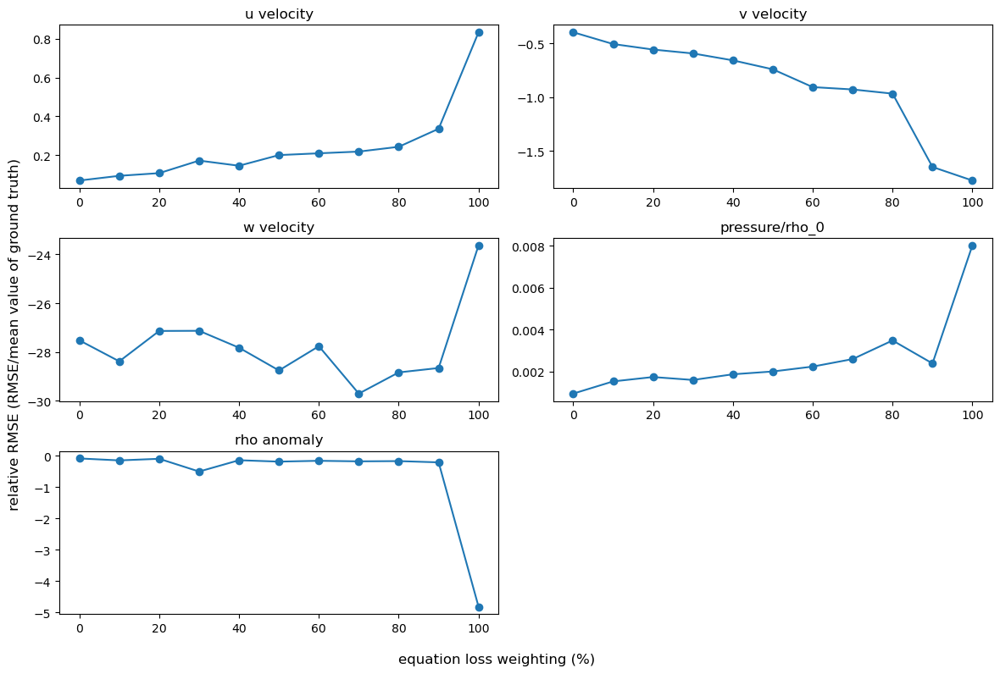

In [73]:
### RELOADING THE MODEL (PLOTTING THE ERROR FOR DIFFERENT GAMMA)

# all_RMSEs = np.zeros((6,len(range(0,110,10))))
# all_RMSEs[0,:] = list(range(0,110,10))
# all_RMSEs

# for i in range(0,11):
# # ckpt_file = "./saved-models/time012_tile45_k1525_j020_i5090/model_iter50000_gamma%03d.ckpt" % gamma
#     gamma = i*10
#     array_file = "./saved-models/time012_tile45_k1525_j020_i5090/model_iter50000_gamma%03d.npz" % gamma
#     loaded_data = np.load(array_file) # to load the arrays from the .npz file:
#     final_RMSE=loaded_data['final_RMSE']
#     all_RMSEs[1:,i]=final_RMSE
    
# all_RMSEs

# tags = ['EVEL', 'NVEL','WVELMASS_interp','RHOAnoma','PHIHYD']
# fig, ax = plt.subplots(1, 1, figsize=(8,5))
# for i in range(all_RMSEs.shape[0]-1):
#     throwaway = ds[tags[i]].isel(tile=4,k=slice(15,25),j=slice(0,20),i=slice(50,90)).mean().values
#     ax.plot(all_RMSEs[0,:], all_RMSEs[i+1,:]/throwaway, 'o-')
    
# ax.set_xlabel('Equation loss percentage')
# ax.set_ylabel('Root mean squared error')
# ax.legend(['u vel','v vel','w vel', 'pressure','density anomaly'])
# # plt.xticks(rotation=45);

fig, axs = plt.subplots(3, 2, figsize=(12,8))
throwaway = ds['EVEL'].isel(tile=4,k=slice(15,25),j=slice(0,20),i=slice(50,90)).mean().values
axs[0,0].plot(all_RMSEs[0,:], all_RMSEs[1,:]/throwaway, 'o-')
axs[0,0].set_title('u velocity')
throwaway = ds['NVEL'].isel(tile=4,k=slice(15,25),j=slice(0,20),i=slice(50,90)).mean().values
axs[0,1].plot(all_RMSEs[0,:], all_RMSEs[2,:]/throwaway, 'o-')
axs[0,1].set_title('v velocity')
throwaway = ds['WVELMASS_interp'].isel(tile=4,k=slice(15,25),j=slice(0,20),i=slice(50,90)).mean().values
axs[1,0].plot(all_RMSEs[0,:], all_RMSEs[3,:]/throwaway, 'o-')
axs[1,0].set_title('w velocity')
throwaway = ds['PHIHYD'].isel(tile=4,k=slice(15,25),j=slice(0,20),i=slice(50,90)).mean().values
axs[1,1].plot(all_RMSEs[0,:], all_RMSEs[4,:]/throwaway, 'o-')
axs[1,1].set_title('pressure/rho_0')
throwaway = ds['RHOAnoma'].isel(tile=4,k=slice(15,25),j=slice(0,20),i=slice(50,90)).mean().values
axs[2,0].plot(all_RMSEs[0,:], all_RMSEs[5,:]/throwaway, 'o-')
axs[2,0].set_title('rho anomaly')
axs[2,1].axis('off')
fig.supxlabel('equation loss weighting (%)')
fig.supylabel('relative RMSE (RMSE/mean value of ground truth)')
plt.tight_layout()

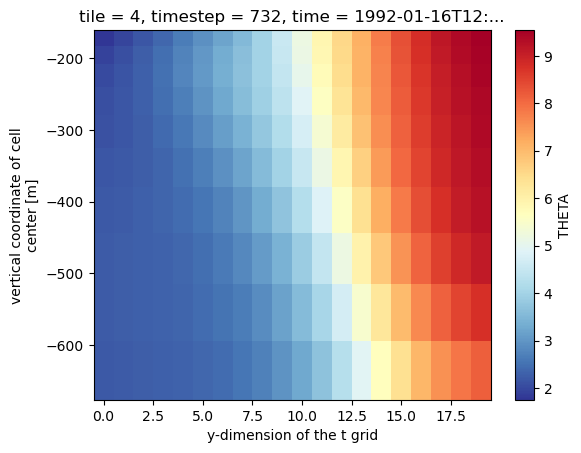

In [79]:
# time_ind = (0,12)
# tile_ind = (4,5)
# k_ind = (15,25)
# j_ind = (0,20) #should be 90
# i_ind = (50,90) #should be 40
ds.THETA.where(ds.maskC).isel(tile=tile_ind[0],time=0,j=slice(*j_ind),i=slice(*i_ind),k=slice(*k_ind)).mean('i').plot(x='j',y='Z',cmap='RdYlBu_r')
plt.show()
# ds.THETA.where(ds.maskC).isel(tile=slice(*tile_ind),time=0,k=0).plot(x='i',y='j',cmap='RdYlBu_r')
# plt.show()
# ds.THETA.where(ds.maskC).isel(tile=slice(*tile_ind),j=slice(*j_ind),i=slice(*i_ind),time=0,k=k_ind[0]).plot(x='i',y='j',cmap='RdYlBu_r')
# plt.show()

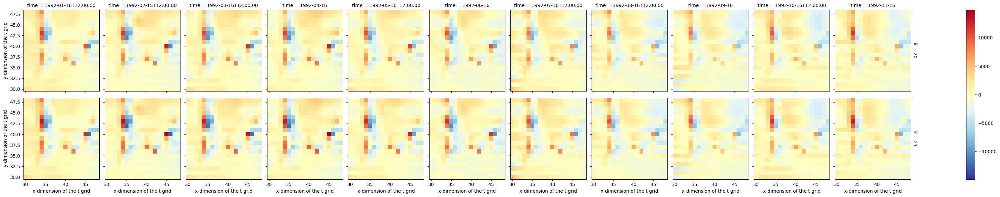

In [47]:
# f = 2*(2*np.pi)/86164*np.sin(ds_model.YC*np.pi/180)
# f = np.mean(f).values
#
# matching_rows_indices = np.where(np.all(np.array_equal(coords_val,residue[:, :coords_val.shape[1]].astype(int)), axis=-1))[0]

# np.where((x == y).all(1))[0]

# residue = char_train[3]/char_train[0]/char_train[8]*ds_eqs['U_T'] + ds_eqs['U_COMP']*ds_eqs['U_X'] + char_train[9]*char_train[3]/char_train[8]/char_train[2]*ds_eqs['V_COMP']*ds_eqs['U_Y'] + char_train[10]*char_train[3]/char_train[1]/char_train[8]*ds_eqs['W_COMP']*ds_eqs['U_Z'] - f*char_train[3]*char_train[9]/char_train[8]**2*ds_eqs['V_COMP'] + char_train[11]/char_train[8]**2*ds_eqs['P_X']
residue = char_train[3]/char_train[0]/char_train[8]*ds_eqs['U_T'] + ds_eqs['U_COMP']*ds_eqs['U_X'] + char_train[9]*char_train[3]/char_train[8]/char_train[2]*ds_eqs['V_COMP']*ds_eqs['U_Y'] + char_train[10]*char_train[3]/char_train[1]/char_train[8]*ds_eqs['W_COMP']*ds_eqs['U_Z'] + f*char_train[3]*char_train[9]/char_train[8]**2*ds_eqs['V_COMP'] + char_train[11]/char_train[8]**2*ds_eqs['P_X']
residue = residue.isel(i=slice(0,-1), j=slice(0,-1), k=slice(0,-1), time=slice(0,-1))
residue.plot(x='i', y='j', row='k', col='time', cmap='RdYlBu_r')

In [23]:
# char_train[3]/char_train[0]/char_train[8]*ds_eqs['U_T'] + ds_eqs['U_COMP']*ds_eqs['U_X'] + char_train[9]*char_train[3]/char_train[8]/char_train[2]*ds_eqs['V_COMP']*ds_eqs['U_Y'] + char_train[10]*char_train[3]/char_train[1]/char_train[8]*ds_eqs['W_COMP']*ds_eqs['U_Z'] - f*char_train[3]*char_train[9]/char_train[8]**2*ds_eqs['V_COMP'] + char_train[11]/char_train[8]**2*ds_eqs['P_X']
# char_train[11]/char_train[8]**2

char_train

array([1.44720000e+07, 6.33950043e+01, 9.27910750e+05, 1.05753950e+06,
       2.02480650e+00, 3.15746307e-01, 2.64935246e+01, 3.21211178e-01,
       1.68508634e-02, 6.77085400e-03, 2.43566615e-06, 3.35433197e+00])

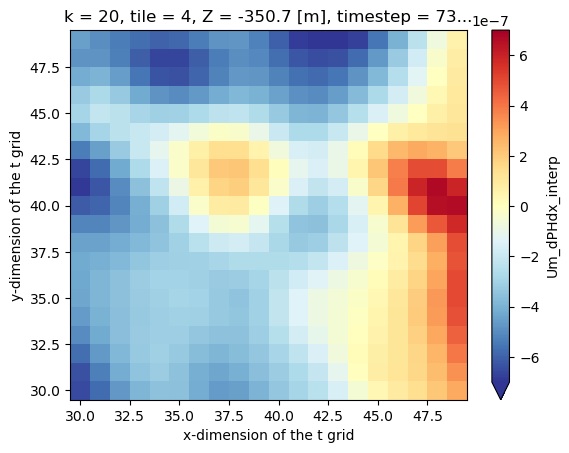

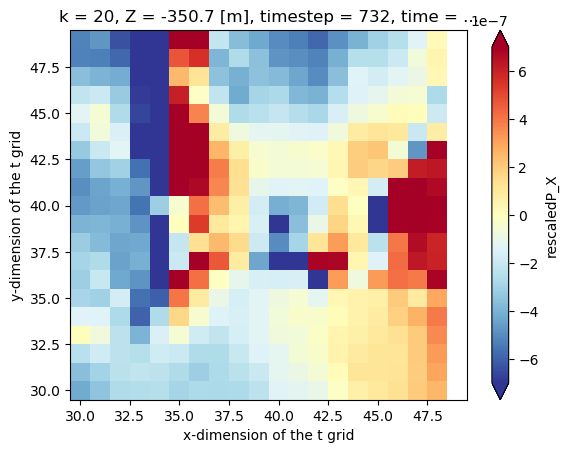

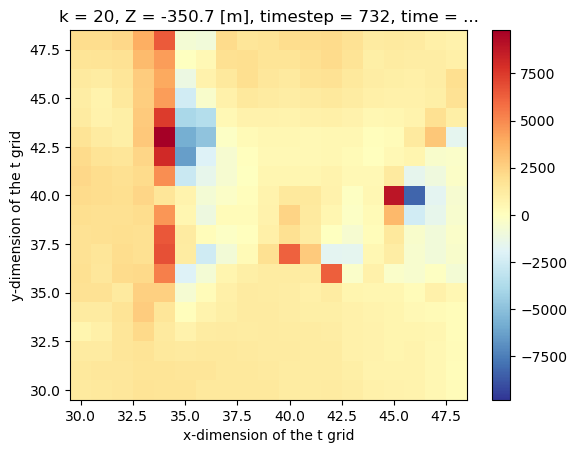

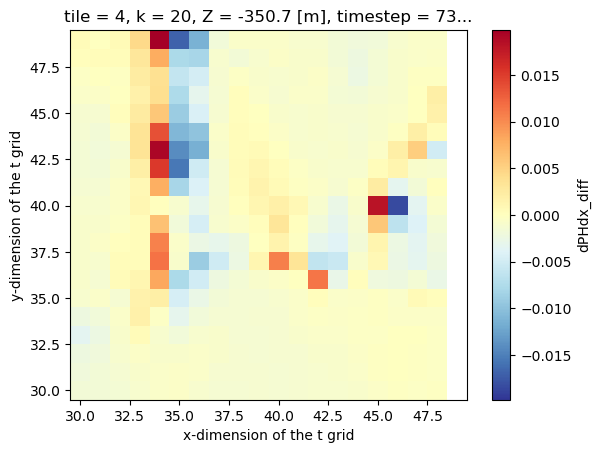

In [27]:
rescaledX = (XC_tiled+1)*char_val[3] + lb_val[3]
rescaledP = (P_COMP+1)*char_val[11] + lb_val[11]
rescaledP_X = np.ma.diff(rescaledP, axis=3).squeeze()/np.ma.diff(rescaledX, axis=3).squeeze()
rescaledP_X = np.lib.pad(rescaledP_X, ((0,0),(0,0),(0,0),(0,1)), 'constant', constant_values=(np.nan))
ds_eqs['rescaledP_X'] = (('time','k','j', 'i'), -1*rescaledP_X)

ds.Um_dPHdx_interp.where(ds.maskC).isel(tile=4,time=0,k=k_ind[0],j=slice(*j_ind),i=slice(*i_ind)).plot(x='i',y='j',cmap='RdYlBu_r',vmin=-7e-7, vmax=7e-7)
plt.show()
# ds_eqs['rescaledP_X'] = (('time','k','j', 'i'), -1*rescaledP_X)
ds_eqs.rescaledP_X.where(ds.maskC).isel(tile=4,time=0,k=0).plot(x='i',y='j',cmap='RdYlBu_r',vmin=-7e-7, vmax=7e-7)
plt.show()

ds_eqs['dPHdx_diff'] = ds.Um_dPHdx_interp - ds_eqs['rescaledP_X']
residue.isel(time=0,k=0).plot(x='i', y='j', cmap='RdYlBu_r')
plt.show()

test = ds_eqs['dPHdx_diff']*char_val[11]/char_val[8]**2

test.isel(time=0,k=0).plot(x='i', y='j', cmap='RdYlBu_r')

In [29]:
### HOW MUCH TRAINING DATA MATCHES UVEL NAVIER STOKES

# t_val = inputs_val[:,0:1]
# z_val = inputs_val[:,1:2]
# y_val = inputs_val[:,2:3]
# x_val = inputs_val[:,3:4]
# u_val = inputs_val[:,8:9]
# v_val = inputs_val[:,9:10]
# w_val = inputs_val[:,10:11]
# p_val = inputs_val[:,11:12]

# new_size = (np.unique(coords_val[:,0]).size,np.unique(coords_val[:,1]).size,np.unique(coords_val[:,2]).size,np.unique(coords_val[:,3]).size)
# ZC_tiled = z_val.reshape(new_size)
# # ZC_tiled = np.lib.pad(ZC_tiled, ((size_offset[0],0),(0,size_offset[1]),(0,size_offset[2]),(0,size_offset[3])), 'constant', constant_values=(np.nan))
# YC_tiled = y_val.reshape(new_size)
# # YC_tiled = np.lib.pad(YC_tiled, ((size_offset[0],0),(0,size_offset[1]),(0,size_offset[2]),(0,size_offset[3])), 'constant', constant_values=(np.nan))
# XC_tiled = x_val.reshape(new_size)
# # XC_tiled = np.lib.pad(XC_tiled, ((size_offset[0],0),(0,size_offset[1]),(0,size_offset[2]),(0,size_offset[3])), 'constant', constant_values=(np.nan))
# T_tiled = t_val.reshape(new_size)
# # T_tiled = np.lib.pad(T_tiled, ((size_offset[0],0),(0,size_offset[1]),(0,size_offset[2]),(0,size_offset[3])), 'constant', constant_values=(np.nan))

# U_COMP = u_val.reshape(new_size)
# V_COMP = v_val.reshape(new_size)
# W_COMP = w_val.reshape(new_size)
# P_COMP = p_val.reshape(new_size)
# RHO_COMP = rho_val.reshape(new_size)

# # # u_t + u*u_x + v*u_y + w*u_z - fv + p_x = 0
# u_t = np.ma.diff(U_COMP, axis=0).squeeze()/np.ma.diff(T_tiled, axis=0).squeeze()
# u_t = np.lib.pad(u_t, ((0,1),(0,0),(0,0),(0,0)), 'constant', constant_values=(np.nan))
# u_x = np.ma.diff(U_COMP, axis=3).squeeze()/np.ma.diff(XC_tiled, axis=3).squeeze()
# u_x = np.lib.pad(u_x, ((0,0),(0,0),(0,0),(0,1)), 'constant', constant_values=(np.nan))
# u_y = np.ma.diff(U_COMP, axis=2).squeeze()/np.ma.diff(YC_tiled, axis=2).squeeze()
# u_y = np.lib.pad(u_y, ((0,0),(0,0),(0,1),(0,0)), 'constant', constant_values=(np.nan))
# u_z = np.ma.diff(U_COMP, axis=1).squeeze()/np.ma.diff(ZC_tiled, axis=1).squeeze()
# u_z = np.lib.pad(u_z, ((0,0),(0,1),(0,0),(0,0)), 'constant', constant_values=(np.nan))
# p_x = np.ma.diff(P_COMP, axis=3).squeeze()/np.ma.diff(XC_tiled, axis=3).squeeze()
# p_x = np.lib.pad(p_x, ((0,0),(0,0),(0,0),(0,1)), 'constant', constant_values=(np.nan))
# # # v_t + u*v_x + v*v_y + w*v_z + fu + p_y = 0
# v_t = np.ma.diff(V_COMP, axis=0).squeeze()/np.ma.diff(T_tiled, axis=0).squeeze()
# v_t = np.lib.pad(v_t, ((0,1),(0,0),(0,0),(0,0)), 'constant', constant_values=(np.nan))
# v_x = np.ma.diff(V_COMP, axis=3).squeeze()/np.ma.diff(XC_tiled, axis=3).squeeze()
# v_x = np.lib.pad(v_x, ((0,0),(0,0),(0,0),(0,1)), 'constant', constant_values=(np.nan))
# v_y = np.ma.diff(V_COMP, axis=2).squeeze()/np.ma.diff(YC_tiled, axis=2).squeeze()
# v_y = np.lib.pad(v_y, ((0,0),(0,0),(0,1),(0,0)), 'constant', constant_values=(np.nan))
# v_z = np.ma.diff(V_COMP, axis=1).squeeze()/np.ma.diff(ZC_tiled, axis=1).squeeze()
# v_z = np.lib.pad(v_z, ((0,0),(0,1),(0,0),(0,0)), 'constant', constant_values=(np.nan))
# p_y = np.ma.diff(P_COMP, axis=2).squeeze()/np.ma.diff(YC_tiled, axis=2).squeeze()
# p_y = np.lib.pad(p_y, ((0,0),(0,0),(0,1),(0,0)), 'constant', constant_values=(np.nan))

# # f = 2*(2*np.pi)/86164*np.sin(((YC_tiled+1)*char_val[2] + lb_val[2])*np.pi/180)
# f = f_val.reshape(new_size)
# ds_eqs = xr.zeros_like(subset_template)
# # zonal momentum
# ds_eqs['U_T'] = (('time','k','j', 'i'), u_t)
# ds_eqs['U_X'] = (('time','k','j', 'i'), u_x)
# ds_eqs['U_Y'] = (('time','k','j', 'i'), u_y)
# ds_eqs['U_Z'] = (('time','k','j', 'i'), u_z)
# ds_eqs['P_X'] = (('time','k','j', 'i'), p_x)
# # meridional momentum
# ds_eqs['V_T'] = (('time','k','j', 'i'), v_t)
# ds_eqs['V_X'] = (('time','k','j', 'i'), v_x)
# ds_eqs['V_Y'] = (('time','k','j', 'i'), v_y)
# ds_eqs['V_Z'] = (('time','k','j', 'i'), v_z)
# ds_eqs['P_Y'] = (('time','k','j', 'i'), p_y)
# # ds_eqs['P_X'] = (('time','k','j', 'i'), P_COMP)
# ds_eqs['U_COMP'] = (('time','k','j', 'i'), U_COMP)
# ds_eqs['V_COMP'] = (('time','k','j', 'i'), V_COMP)
# ds_eqs['W_COMP'] = (('time','k','j', 'i'), W_COMP)
# ds_eqs['P_COMP'] = (('time','k','j', 'i'), P_COMP)
# # ds_eqs = xr.merge([ds_eqs, U_COMP, V_COMP, W_COMP, P_COMP],compat='override')

# ds_eqs = ds_eqs.reset_coords(['U_T','U_X','U_Y','U_Z','P_X','U_COMP','V_COMP','W_COMP','P_COMP']) # move from coordinate to variable
# ds_eqs = ds_eqs.reset_coords(['V_T','V_X','V_Y','V_Z','P_Y']) # move from coordinate to variable
# ds_eqs = ds_eqs.drop_vars('THETA')

residue_fu = char_val[8]/char_val[0]/f/char_val[9]*ds_eqs['U_T'] + char_val[8]**2/char_val[3]/f/char_val[9]*ds_eqs['U_COMP']*ds_eqs['U_X'] + char_val[8]/f/char_val[2]*ds_eqs['V_COMP']*ds_eqs['U_Y'] + char_val[8]*char_val[10]/char_val[1]/f/char_val[9]*ds_eqs['W_COMP']*ds_eqs['U_Z'] - ds_eqs['V_COMP'] + char_val[11]/char_val[3]/f/char_val[9]*ds_eqs['P_X']
residue_fu = residue_fu.isel(i=slice(0,-1), j=slice(0,-1), k=slice(0,-1), time=slice(0,-1))

residue_fv = char_val[9]/char_val[0]/f/char_val[8]*ds_eqs['V_T'] + char_val[9]/f/char_val[3]*ds_eqs['U_COMP']*ds_eqs['V_X'] + char_val[9]**2/f/char_val[8]/char_val[2]*ds_eqs['V_COMP']*ds_eqs['V_Y'] + char_val[10]*char_val[9]/f/char_val[1]/char_val[8]*ds_eqs['W_COMP']*ds_eqs['V_Z'] + ds_eqs['U_COMP'] + char_val[11]/f/char_val[2]/char_val[8]*ds_eqs['P_Y']
residue_fv = residue_fv.isel(i=slice(0,-1), j=slice(0,-1), k=slice(0,-1), time=slice(0,-1))

# residue_fu.plot(x='i', y='j', row='k', col='time', cmap='RdYlBu_r')
# plt.show()
# residue_fv.plot(x='i', y='j', row='k', col='time', cmap='RdYlBu_r')
# plt.show()


# # linearize 
residue_fu = using_multiindex(residue_fu.squeeze().values, ['time', 'k', 'j', 'i'])
residue_fu = residue_fu.to_numpy()
train_idx = range(len(residue_fu[:,0]))
residue_fu = residue_fu[train_idx,:] # subsample the training data
# residue = residue[:,4:] # trim array by cutting out coordinates
residue_fu[np.isnan(residue_fu)] = 0

residue_fv = using_multiindex(residue_fv.squeeze().values, ['time', 'k', 'j', 'i'])
residue_fv = residue_fv.to_numpy()
train_idx = range(len(residue_fv[:,0]))
residue_fv = residue_fv[train_idx,:] # subsample the training data
# residue = residue[:,4:] # trim array by cutting out coordinates
residue_fv[np.isnan(residue_fv)] = 0

# get indices of the residue points in linearized form
res = (coords_val[:,None] == residue_fu[:, :coords_val.shape[1]].astype(int)).all(-1).any(-1)
res = np.where(res)

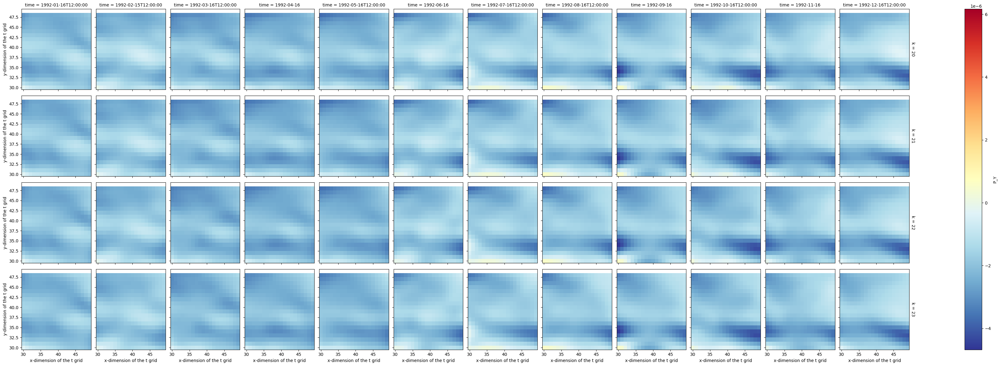

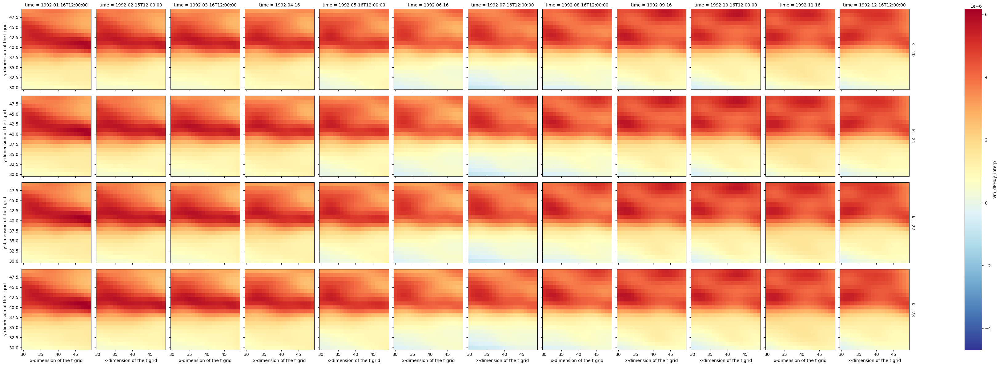

In [22]:
### HOW MUCH PRESSURE TENDENCIES ACTUALLY RESEMBLE THE DIAGNOSTIC OUTPUT 

# YC_tiled = ((y_val+1)*char_val[2] + lb_val[2]).reshape(new_size)
# P_COMP = ((p_val+1)*char_val[11] + lb_val[11]).reshape(new_size)
# XC_tiled = ((x_val+1)*char_val[3] + lb_val[3]).reshape(new_size)

# p_y = np.ma.diff(P_COMP, axis=2).squeeze()/np.ma.diff(YC_tiled, axis=2).squeeze()
# p_y = np.lib.pad(p_y, ((0,0),(0,0),(0,1),(0,0)), 'constant', constant_values=(np.nan))
# p_x = np.ma.diff(P_COMP, axis=3).squeeze()/np.ma.diff(XC_tiled, axis=3).squeeze()
# p_x = np.lib.pad(p_x, ((0,0),(0,0),(0,0),(0,1)), 'constant', constant_values=(np.nan))

# ds_eqs = xr.zeros_like(subset_template)
# ds_eqs['P_Y'] = (('time','k','j', 'i'), p_y)
# ds_eqs['P_X'] = (('time','k','j', 'i'), p_x)
# ds_eqs = ds_eqs.reset_coords(['P_Y','P_X']) # move from coordinate to variable
# ds_eqs = ds_eqs.drop_vars('THETA')

vmin = min(ds_eqs['P_Y'].min(),ds['Vm_dPHdy_interp'].isel(tile=slice(*tile_ind),j=slice(*j_ind),i=slice(*i_ind),time=slice(*time_ind),k=slice(*k_ind)).min()).values
vmax = max(ds_eqs['P_Y'].max(),ds['Vm_dPHdy_interp'].isel(tile=slice(*tile_ind),j=slice(*j_ind),i=slice(*i_ind),time=slice(*time_ind),k=slice(*k_ind)).max()).values
ds_eqs['P_Y'].plot(x='i',y='j',row='k', col='time', cmap='RdYlBu_r',vmin=vmin, vmax=vmax)
plt.show()
ds['Vm_dPHdy_interp'].isel(tile=slice(*tile_ind),j=slice(*j_ind),i=slice(*i_ind),time=slice(*time_ind),k=slice(*k_ind)).plot(x='i',y='j',row='k', col='time',cmap='RdYlBu_r',vmin=vmin, vmax=vmax)
plt.show()

# residue = char_train[3]/char_train[0]/char_train[8]*ds_eqs['U_T'] + ds_eqs['U_COMP']*ds_eqs['U_X'] + char_train[9]*char_train[3]/char_train[8]/char_train[2]*ds_eqs['V_COMP']*ds_eqs['U_Y'] + char_train[10]*char_train[3]/char_train[1]/char_train[8]*ds_eqs['W_COMP']*ds_eqs['U_Z'] - f*char_train[3]*char_train[9]/char_train[8]**2*ds_eqs['V_COMP'] + char_train[11]/char_train[8]**2*ds_eqs['P_X']
# residue = residue.isel(i=slice(0,-1), j=slice(0,-1), k=slice(0,-1), time=slice(0,-1))
# residue.plot(x='i', y='j', row='k', col='time', cmap='RdYlBu_r')

In [36]:
# coords_val = ((inputs_val[:,0:4]+1)*char_val[0:4] + lb_val[0:4])
# coords_val[:,2:4] = coords_val[:,2:4]/111.32/1000
# # coords_val = coords_val.astype(int)
# coords_val

array([[ 2.63520000e+06, -5.00000000e+00, -6.17557447e+01,
         6.25000000e+01],
       [ 2.63520000e+06, -5.00000000e+00, -6.17557447e+01,
         6.35000000e+01],
       [ 2.63520000e+06, -5.00000000e+00, -6.17557447e+01,
         6.45000000e+01],
       ...,
       [ 3.15792000e+07, -1.10590503e+03, -5.72714068e+01,
         6.94999955e+01],
       [ 3.15792000e+07, -1.10590503e+03, -5.72714068e+01,
         7.05000000e+01],
       [ 3.15792000e+07, -1.10590503e+03, -5.72714068e+01,
         7.15000000e+01]])

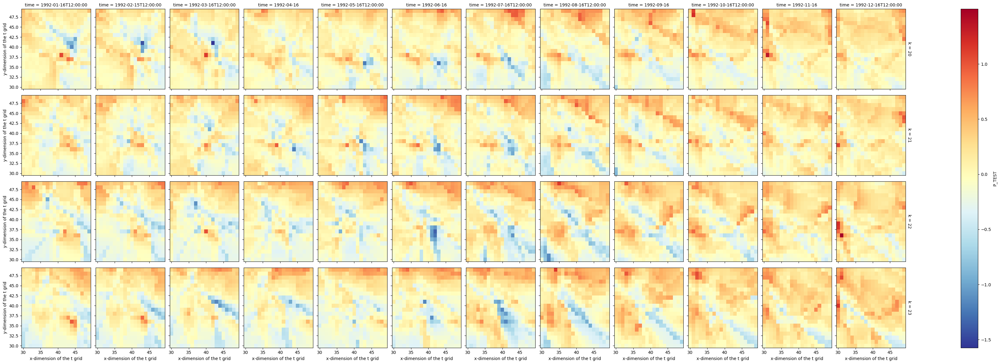

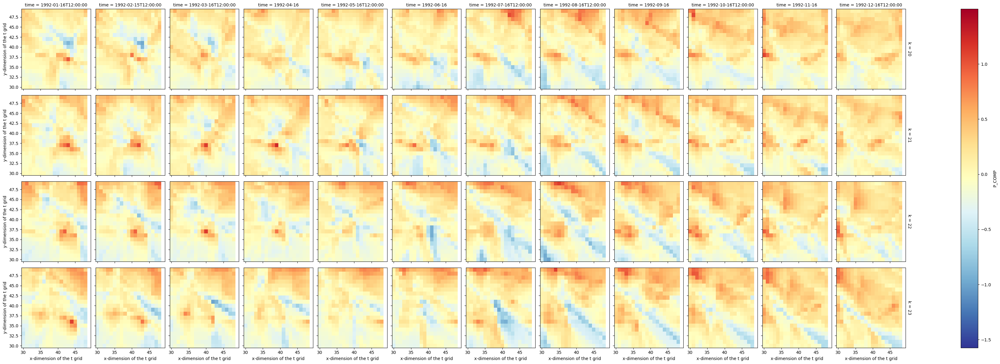

In [28]:
### WORKING GRADIENTS

# if __name__ == "__main__": 

#     all_grad, u_hat = model.compute_gradients(t_val, z_val, y_val, x_val, T_val, S_val)

P_TEST = all_grad[3].reshape(new_size)
P_TEST = np.lib.pad(P_TEST, ((size_offset[0],0),(0,size_offset[1]),(0,size_offset[2]),(0,size_offset[3])), 'constant', constant_values=(0))
ds_model['P_TEST'] = (('time','k','j', 'i'), P_TEST.squeeze())
ds_model = ds_model.reset_coords(['P_TEST']) # move from coordinate to variable

# ZC_tiled = z_val.reshape(new_size)
# YC_tiled = np.lib.pad(YC_tiled, ((size_offset[0],0),(0,size_offset[1]),(0,size_offset[2]),(0,size_offset[3])), 'constant', constant_values=(np.nan))
# YC_tiled = y_val.reshape(new_size)
# YC_tiled = np.lib.pad(YC_tiled, ((size_offset[0],0),(0,size_offset[1]),(0,size_offset[2]),(0,size_offset[3])), 'constant', constant_values=(np.nan))
XC_tiled = x_val.reshape(new_size)
# XC_tiled = np.lib.pad(XC_tiled, ((size_offset[0],0),(0,size_offset[1]),(0,size_offset[2]),(0,size_offset[3])), 'constant', constant_values=(np.nan))
# T_tiled = t_val.reshape(new_size)
# T_tiled = np.lib.pad(T_tiled, ((size_offset[0],0),(0,size_offset[1]),(0,size_offset[2]),(0,size_offset[3])), 'constant', constant_values=(np.nan))

P_COMP = u_pred.reshape(new_size)
P_COMP = np.lib.pad(P_COMP, ((size_offset[0],0),(0,size_offset[1]),(0,size_offset[2]),(0,size_offset[3])), 'constant', constant_values=(0))
ds_model['P_COMP'] = (('time','k','j', 'i'), P_COMP.squeeze())
ds_model['P_COMP'] = ds_model['P_COMP'].where(ds.maskC.isel(tile=slice(*tile_ind),k=slice(*k_ind),j=slice(*j_ind),i=slice(*i_ind))) # nan out land
P_COMP = np.ma.diff(ds_model['P_COMP'], axis=3).squeeze()/np.ma.diff(XC_tiled, axis=3).squeeze()
P_COMP = np.lib.pad(P_COMP, ((0,0),(0,0),(0,0),(0,1)), 'constant', constant_values=(np.nan))
ds_model['P_COMP'] = (('time','k','j', 'i'), P_COMP.squeeze())

vmin = min(ds_model['P_TEST'].min(),ds_model['P_COMP'].min()).values
vmax = max(ds_model['P_TEST'].max(),ds_model['P_COMP'].max()).values
ds_model['P_TEST'].where(ds.maskC.isel(tile=slice(*tile_ind),k=slice(*k_ind),j=slice(*j_ind),i=slice(*i_ind))).isel(time=slice(0,12)).plot(x='i', y='j', row='k', col='time', cmap='RdYlBu_r',vmin=vmin, vmax=vmax)
ds_model['P_COMP'].isel(time=slice(0,12)).plot(x='i', y='j', row='k', col='time', cmap='RdYlBu_r',vmin=vmin, vmax=vmax)
# ds_model['UVEL_pred'].isel(time=slice(0,12)).plot(x='i', y='j', row='k', col='time', cmap='RdYlBu_r')

In [28]:
# analyzer = innvestigate.create_analyzer('deep_taylor',model)
# facet1err.size//20
# analyzer = innvestigate.analyzer.relevance_based.relevance_analyzer.BaselineLRPZ(model)


#"No analyzer with the name 'LRP-epsilon' could be found. All possible names are: ['input', 'random', 'gradient', 'gradient.baseline', 'input_t_gradient', 'deconvnet', 'guided_backprop', 'integrated_gradients', 'smoothgrad', 'lrp', 'lrp.z', 'lrp.z_IB', 'lrp.epsilon', 'lrp.epsilon_IB', 'lrp.w_square', 'lrp.flat', 'lrp.alpha_beta', 'lrp.alpha_2_beta_1', 'lrp.alpha_2_beta_1_IB', 'lrp.alpha_1_beta_0', 'lrp.alpha_1_beta_0_IB', 'lrp.z_plus', 'lrp.z_plus_fast', 'lrp.sequential_preset_a', 'lrp.sequential_preset_b', 'lrp.sequential_preset_a_flat', 'lrp.sequential_preset_b_flat', 'lrp.sequential_preset_b_flat_until_idx', 'deep_taylor', 'deep_taylor.bounded', 'deep_lift.wrapper', 'pattern.net', 'pattern.attribution']"

536

In [24]:
# def using_multiindex(A, columns):
#     shape = A.shape
#     index = pd.MultiIndex.from_product([range(s) for s in shape], names=columns)
#     df = pd.DataFrame({'A': A.flatten()}, index=index).reset_index()
#     return df

# def undo_multiindex(A, columns):
#     # Set the MultiIndex based on the specified columns
#     A.set_index(columns, inplace=True)
#     # Unstack the DataFrame to convert it back to a NumPy array
#     result_array = df.unstack().to_numpy()

#     return result_array
# using_multiindex(subset_template.squeeze().values, ['time', 'k', 'j', 'i'])

# unique_coordinates, indices = np.unique(col_train[:,0:5], axis=0, return_inverse=True)

# dimensions = unique_coordinates.shape[0],  # Assumes a 1D array of unique indices

# ## Create an empty 4D array filled with NaN (or any default value)

# resulting_array = np.full(dimensions + (1,), np.nan)
# resulting_array[indices, 0] = u_t[0]

# u_t, uu_x, vu_y, wu_z, fv, p_x, u_predictions 

# fig = plt.figure(figsize=(8, 6))
# ax = fig.add_subplot(111, projection='3d')
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False
# ax.zaxis.pane.fill = False
# scatter = ax.scatter(col_train[:,3], col_train[:,2], col_train[:,1], c=u_predictions[30], marker='.', cmap='RdYlBu_r')
# cbar = fig.colorbar(scatter)

# fig = plt.figure(figsize=(8, 6))
# ax = fig.add_subplot(111, projection='3d')
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False
# ax.zaxis.pane.fill = False
# scatter = ax.scatter(inputs_val[:,3], inputs_val[:,2], inputs_val[:,1], c=inputs_val[:,8], marker='.', cmap='RdYlBu_r')
# cbar = fig.colorbar(scatter)

# fig = plt.figure(figsize=(8, 6))
# ax = fig.add_subplot(111, projection='3d')
# plt.tricontourf(col_train[:,3], col_train[:,2], col_train[:,1],colors=u_predictions[30])

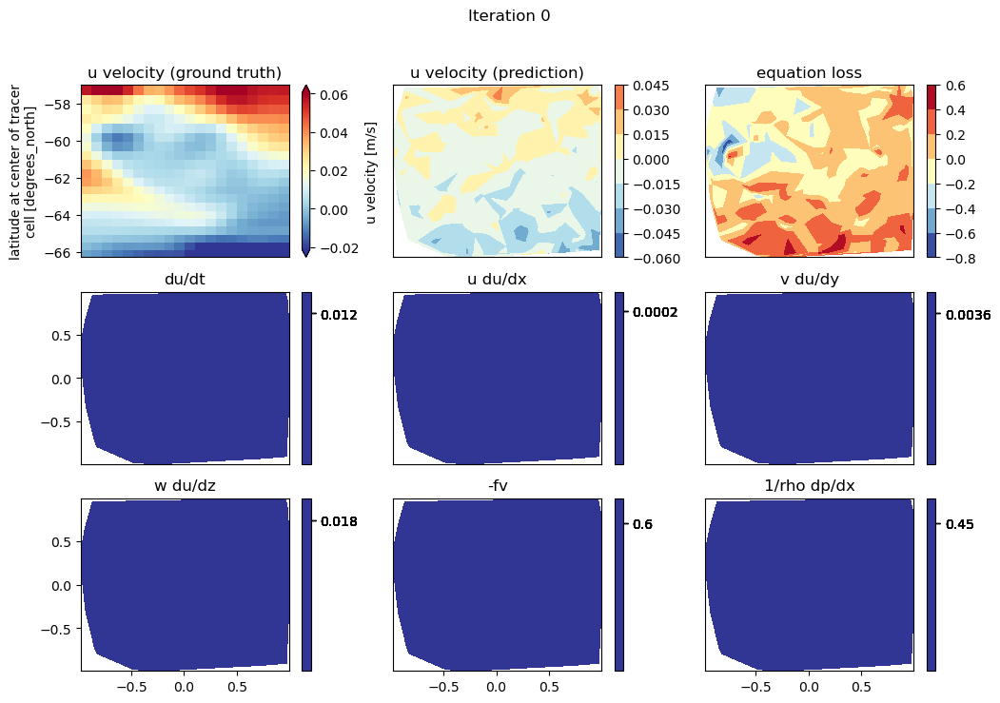

In [48]:
### Animation of different iterations USING FCOL 

### NOT YET WORKING DO NOT USE

fig, ax = plt.subplots(3,3,figsize=(12,8))
chosen_depth_ind = 0
chosen_time_ind = 0
# for i in len(u_predictions):
#     u_predictions_scaled = (u_predictions+1)*char_train[8]+lb_train[8]

# picture of ground truth
ds_model.EVEL.isel(time=chosen_time_ind,k=chosen_depth_ind).plot(x='XC',y='YC',cmap='RdYlBu_r',vmin=ds_model.NVEL.isel(time=chosen_time_ind,k=chosen_depth_ind).min().values,vmax=ds_model.NVEL.isel(time=chosen_time_ind,k=chosen_depth_ind).max().values,ax=ax[0,0],cbar_kwargs={'label': 'u velocity [m/s]'})
ax[0,0].set_xlabel('')
ax[0,0].set_xticks([])
ax[0,0].set_title('u velocity (ground truth)')

# picture of the uvel
# u_map = ds_model.U_PREDICTIONS.isel(time=0,k=0,iters=0).plot(x='XC',y='YC',cmap='RdYlBu_r',vmin=ds_model.NVEL.isel(time=0,k=0).min().values,vmax=ds_model.NVEL.isel(time=0,k=0).max().values,ax=ax[0,1],cbar_kwargs={'label': 'u velocity [m/s]'})
# u_map = ds_model.U_PREDICTIONS.isel(time=0,k=0,iters=-1).plot(x='XC',y='YC',cmap='RdYlBu_r',ax=ax[0,1],cbar_kwargs={'label': 'u velocity [m/s]'})
u_map = ax[0,1].tricontourf(col_train[plot_col_ind,3], col_train[plot_col_ind,2], ((u_predictions[-1][plot_col_ind]+1)*char_train[8]+lb_train[8]).squeeze(), vmin=ds_model.EVEL.isel(time=chosen_time_ind,k=chosen_depth_ind).min(), vmax=ds_model.EVEL.isel(time=chosen_time_ind,k=chosen_depth_ind).max(),cmap='RdYlBu_r')
plt.colorbar(u_map,ax=ax[0,1])
ax[0,1].set_xlabel('')
ax[0,1].set_xticks([])
ax[0,1].set_ylabel('')
ax[0,1].set_yticks([])
ax[0,1].set_title('u velocity (prediction)')

# equation residue map
# eq_map = ds_model.EQ_RES.isel(time=chosen_time_ind,k=chosen_depth_ind,iters=0).plot(x='XC',y='YC',cmap='RdBu_r',vmin=ds_model.EQ_RES.isel(time=chosen_time_ind,k=chosen_depth_ind,iters=-1).min().values,vmax=ds_model.EQ_RES.isel(time=chosen_time_ind,k=chosen_depth_ind,iters=-1).max().values,ax=ax[0,2])#,cbar_kwargs={'label': 'equation residue [m/s^2]'})
eq_map = ax[0,2].tricontourf(col_train[plot_col_ind,3], col_train[plot_col_ind,2], eq_res[-1][plot_col_ind].squeeze(), vmin=eq_res[-1][plot_col_ind].min(), vmax=eq_res[-1][plot_col_ind].max(),cmap='RdYlBu_r')
plt.colorbar(eq_map,ax=ax[0,2])
ax[0,2].set_xlabel('')
ax[0,2].set_xticks([])
ax[0,2].set_ylabel('')
ax[0,2].set_yticks([])
ax[0,2].set_title('equation loss')
#
# u_t_map = ds_model.U_T.isel(time=chosen_time_ind,k=chosen_depth_ind,iters=0).plot(x='XC',y='YC',cmap='RdBu_r',vmin=ds_model.U_T.isel(time=chosen_time_ind,k=chosen_depth_ind,iters=-1).min(), vmax=ds_model.U_T.isel(time=chosen_time_ind,k=chosen_depth_ind,iters=-1).max(), ax=ax[1,0])#,cbar_kwargs={'label': 'du/dt [m/s^2]'})
u_t_map = ax[1,0].tricontourf(col_train[plot_col_ind,3], col_train[plot_col_ind,2], u_t[-1][plot_col_ind].squeeze(),vmin=u_t[-1][plot_col_ind].min(),vmax=u_t[-1][plot_col_ind].min(),cmap='RdYlBu_r')
plt.colorbar(u_t_map,ax=ax[1,0])
ax[1,0].set_xlabel('')
ax[1,0].set_xticks([])
ax[1,0].set_title('du/dt')

# uu_x_map = ds_model.UU_X.isel(time=chosen_time_ind,k=chosen_depth_ind,iters=0).plot(x='XC',y='YC',cmap='RdBu_r',vmin=ds_model.UU_X.isel(time=chosen_time_ind,k=chosen_depth_ind,iters=-1).min(), vmax=2*ds_model.UU_X.isel(time=chosen_time_ind,k=chosen_depth_ind,iters=-1).max(), ax=ax[1,1])#,cbar_kwargs={'label': 'udu/dx [m/s^2]'})
uu_x_map = ax[1,1].tricontourf(col_train[plot_col_ind,3], col_train[plot_col_ind,2], uu_x[-1][plot_col_ind].squeeze(),vmin=uu_x[-1][plot_col_ind].min(),vmax=uu_x[-1][plot_col_ind].min(),cmap='RdYlBu_r')
plt.colorbar(uu_x_map,ax=ax[1,1])
ax[1,1].set_xlabel('')
ax[1,1].set_xticks([])
ax[1,1].set_ylabel('')
ax[1,1].set_yticks([])
ax[1,1].set_title('u du/dx')

# vu_y_map = ds_model.VU_Y.isel(time=chosen_time_ind,k=chosen_depth_ind,iters=0).plot(x='XC',y='YC',cmap='RdBu_r',vmin=ds_model.VU_Y.isel(time=chosen_time_ind,k=chosen_depth_ind,iters=-1).min(), vmax=2*ds_model.VU_Y.isel(time=chosen_time_ind,k=chosen_depth_ind,iters=-1).max(), ax=ax[1,2])#,cbar_kwargs={'label': 'vdu/dy [m/s^2]'})
vu_y_map = ax[1,2].tricontourf(col_train[plot_col_ind,3], col_train[plot_col_ind,2], vu_y[-1][plot_col_ind].squeeze(),vmin=vu_y[-1][plot_col_ind].min(),vmax=vu_y[-1][plot_col_ind].min(),cmap='RdYlBu_r')
plt.colorbar(vu_y_map,ax=ax[1,2])
ax[1,2].set_xlabel('')
ax[1,2].set_xticks([])
ax[1,2].set_ylabel('')
ax[1,2].set_yticks([])
ax[1,2].set_title('v du/dy')

# wu_z_map = ds_model.WU_Z.isel(time=chosen_time_ind,k=chosen_depth_ind,iters=0).plot(x='XC',y='YC',cmap='RdBu_r',vmin=ds_model.WU_Z.isel(time=chosen_time_ind,k=chosen_depth_ind,iters=-1).min(), vmax=ds_model.WU_Z.isel(time=0,k=chosen_depth_ind,iters=-1).max(), ax=ax[2,0])#,cbar_kwargs={'label': 'wdu/dz [m/s^2]'})
wu_z_map = ax[2,0].tricontourf(col_train[plot_col_ind,3], col_train[plot_col_ind,2], wu_z[-1][plot_col_ind].squeeze(),vmin=wu_z[-1][plot_col_ind].min(),vmax=wu_z[-1][plot_col_ind].min(),cmap='RdYlBu_r')
plt.colorbar(wu_z_map,ax=ax[2,0])
ax[2,0].set_title('w du/dz')

# fv_map = ds_model.FV.isel(time=chosen_time_ind,k=chosen_depth_ind,iters=0).plot(x='XC',y='YC',cmap='RdBu_r',vmin=ds_model.FV.isel(time=chosen_time_ind,k=chosen_depth_ind,iters=-1).min(), vmax=ds_model.FV.isel(time=0,k=chosen_depth_ind,iters=-1).max(), ax=ax[2,1])#,cbar_kwargs={'label': 'fv [m/s^2]'})
fv_map = ax[2,1].tricontourf(col_train[plot_col_ind,3], col_train[plot_col_ind,2], fv[-1][plot_col_ind].squeeze(),vmin=fv[-1][plot_col_ind].min(),vmax=fv[-1][plot_col_ind].min(),cmap='RdYlBu_r')
plt.colorbar(fv_map,ax=ax[2,1])
ax[2,1].set_ylabel('')
ax[2,1].set_yticks([])
ax[2,1].set_title('-fv')

p_x_map = ax[2,2].tricontourf(col_train[plot_col_ind,3], col_train[plot_col_ind,2], p_x[-1][plot_col_ind].squeeze(),vmin=p_x[-1][plot_col_ind].min(),vmax=p_x[-1][plot_col_ind].min(),cmap='RdYlBu_r')
# p_x_map = ds_model.P_X.isel(time=chosen_time_ind,k=chosen_depth_ind,iters=0).plot(x='XC',y='YC',cmap='RdBu_r',vmin=-ds_model.FV.isel(time=chosen_time_ind,k=chosen_depth_ind,iters=-1).max(), vmax=-ds_model.FV.isel(time=0,k=chosen_depth_ind,iters=-1).min(), ax=ax[2,2])#,cbar_kwargs={'label': '1/rho dp/dx [m/s^2]'})
plt.colorbar(p_x_map,ax=ax[2,2])
ax[2,2].set_ylabel('')
ax[2,2].set_yticks([])
ax[2,2].set_title('1/rho dp/dx')

fig.suptitle('Iteration 1')


def animate(frame):
    # change the data for each of the panels
    # u_map.set_array(ds_model.U_PREDICTIONS.isel(time=,k=0,iters=frame).values.flatten())
    # eq_map.set_array(ds_model.EQ_RES.isel(time=0,k=0,iters=frame).values.flatten())
    # u_t_map.set_array(ds_model.U_T.isel(time=0,k=0,iters=frame).values.flatten())
    # uu_x_map.set_array(ds_model.UU_X.isel(time=0,k=0,iters=frame).values.flatten())
    # vu_y_map.set_array(ds_model.VU_Y.isel(time=0,k=0,iters=frame).values.flatten())
    # wu_z_map.set_array(ds_model.WU_Z.isel(time=0,k=0,iters=frame).values.flatten())
    # fv_map.set_array(ds_model.FV.isel(time=0,k=0,iters=frame).values.flatten())
    # p_x_map.set_array(ds_model.P_X.isel(time=0,k=0,iters=frame).values.flatten())
    u_map.set_array(((u_predictions[frame][plot_col_ind]+1)*char_train[8]+lb_train[8]).squeeze())
    eq_map.set_array(eq_res[frame][plot_col_ind].squeeze())
    u_t_map.set_array(u_t[frame][plot_col_ind].squeeze())
    uu_x_map.set_array(uu_x[frame][plot_col_ind].squeeze())
    vu_y_map.set_array(vu_y[frame][plot_col_ind].squeeze())
    wu_z_map.set_array(wu_z[frame][plot_col_ind].squeeze())
    fv_map.set_array(fv[frame][plot_col_ind].squeeze())
    p_x_map.set_array(p_x[frame][plot_col_ind].squeeze())
    
    # change iteration number
    fig.suptitle("Iteration "+str(100*frame))
#     ax[1].scatter(ds_model.iteration[frame*20], facet1err[frame*20], s = 10, color='blue')

# ani = animation.FuncAnimation(fig, animate, (ds_model.iteration.size)//skip) # len(eq_res)
ani = animation.FuncAnimation(fig, partial(animate), ds_model.iteration.size)

# ani.save('./images/all_terms.gif', writer='imagemagick', fps = 5) #Save animation as gif-file

# # display afterwards so that it doesn't mess up the gif
HTML(ani.to_jshtml()) #Show the animation in the kernel

NameError: name 'ds_model' is not defined

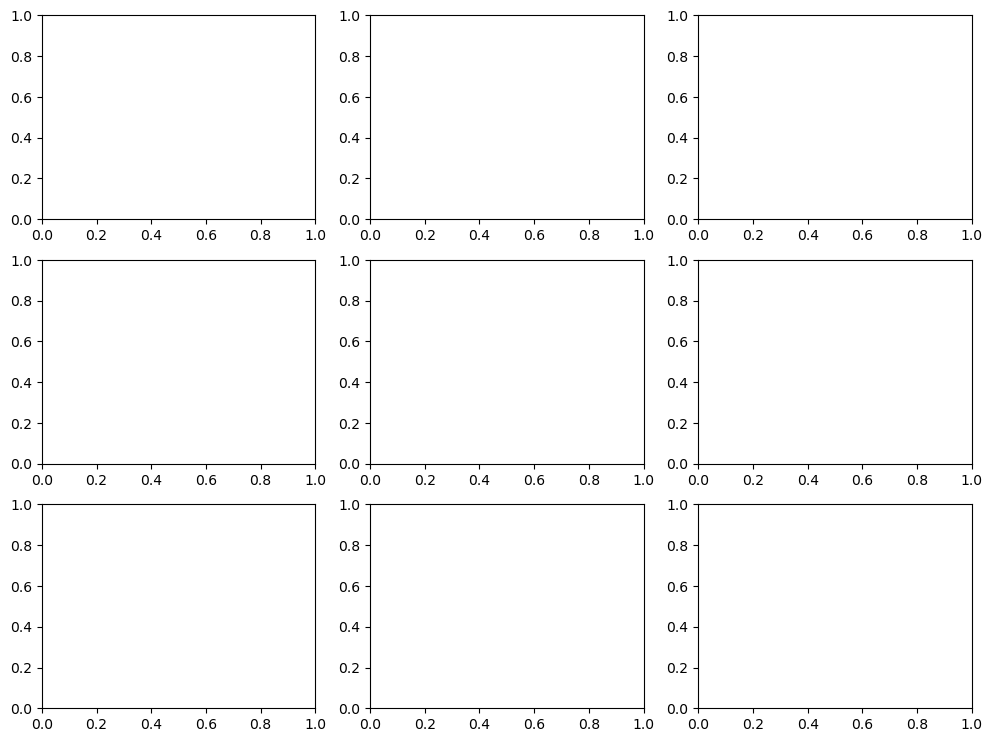

In [8]:
## OLD ANIMATION - WORKS FOR WHEN COLLOCATION POINTS ARE INPUTS_VAL

fig, ax = plt.subplots(3,3,figsize=(12,9))

chosen_depth=28

# picture of ground truth
ds_model.EVEL.isel(time=0,k=chosen_depth).plot(x='XC',y='YC',cmap='RdYlBu_r',vmin=ds_model.EVEL.isel(time=0,k=chosen_depth).min().values,vmax=ds_model.EVEL.isel(time=0,k=chosen_depth).max().values,ax=ax[0,0],cbar_kwargs={'label': 'u velocity [m/s]'})
ax[0,0].set_xlabel('')
ax[0,0].set_xticks([])
ax[0,0].set_title('u velocity (ground truth)')

# picture of the uvel
u_map = ds_model.U_PREDICTIONS.isel(time=0,k=chosen_depth,iters=0).plot(x='XC',y='YC',cmap='RdYlBu_r',vmin=ds_model.EVEL.isel(time=0,k=chosen_depth).min().values,vmax=ds_model.EVEL.isel(time=0,k=chosen_depth).max().values,ax=ax[0,1],cbar_kwargs={'label': 'u velocity [m/s]'})
# u_map = ds_model.U_PREDICTIONS.isel(time=0,k=0,iters=0).plot(x='XC',y='YC',cmap='RdYlBu_r',ax=ax[0,1],cbar_kwargs={'label': 'u velocity [m/s]'})
ax[0,1].set_xlabel('')
ax[0,1].set_xticks([])
ax[0,1].set_ylabel('')
ax[0,1].set_yticks([])
ax[0,1].set_title('u velocity (prediction)')

# equation residue map
eq_map = ds_model.EQ_RES.isel(time=0,k=chosen_depth,iters=0).plot(x='XC',y='YC',cmap='RdBu_r',vmin=ds_model.EQ_RES.isel(time=0,k=chosen_depth,iters=-1).min().values,vmax=ds_model.EQ_RES.isel(time=0,k=chosen_depth,iters=-1).max().values,ax=ax[0,2],cbar_kwargs={'label': ''})
ax[0,2].set_xlabel('')
ax[0,2].set_xticks([])
ax[0,2].set_ylabel('')
ax[0,2].set_yticks([])
ax[0,2].set_title('equation loss')

# mean equation residue scatter
# facet1err = ds_model.EQ_RES.isel(time=0,k=0).mean(['i','j'])
# ax[0,1].scatter(ds_model.iteration[0], facet1err[0], s = 10, color='blue')
# ax[0,1].set_xlabel('iterations')
# # ax[1].set_ylabel('equation residue')
# ax[0,1].set_xlim([0, facet1err.size])
# ax[0,1].set_ylim([ds_model.EQ_RES.isel(time=0,k=0).min(), ds_model.EQ_RES.isel(time=0,k=0).max()])

#
u_t_map = ds_model.U_T.isel(time=0,k=chosen_depth,iters=0).plot(x='XC',y='YC',cmap='RdBu_r',vmin=ds_model.U_T.isel(time=0,k=chosen_depth,iters=-1).min(), vmax=ds_model.U_T.isel(time=0,k=chosen_depth,iters=-1).max(), ax=ax[1,0],cbar_kwargs={'label': ''})
# u_t_map = ds_model.U_T.isel(time=0,k=0,iters=500).plot(x='XC',y='YC',cmap='RdBu_r', ax=ax[1,0])#,cbar_kwargs={'label': 'du/dt [m/s^2]'})
ax[1,0].set_xlabel('')
ax[1,0].set_xticks([])
ax[1,0].set_title('du/dt')
uu_x_map = ds_model.UU_X.isel(time=0,k=chosen_depth,iters=0).plot(x='XC',y='YC',cmap='RdBu_r',vmin=ds_model.UU_X.isel(time=0,k=chosen_depth,iters=-1).min(), vmax=2*ds_model.UU_X.isel(time=0,k=chosen_depth,iters=-1).max(), ax=ax[1,1],cbar_kwargs={'label': ''})
# uu_x_map = ds_model.UU_X.isel(time=0,k=0,iters=500).plot(x='XC',y='YC',cmap='RdBu_r', ax=ax[1,1])#,cbar_kwargs={'label': 'udu/dx [m/s^2]'})
ax[1,1].set_xlabel('')
ax[1,1].set_xticks([])
ax[1,1].set_ylabel('')
ax[1,1].set_yticks([])
ax[1,1].set_title('u du/dx')
vu_y_map = ds_model.VU_Y.isel(time=0,k=chosen_depth,iters=0).plot(x='XC',y='YC',cmap='RdBu_r',vmin=ds_model.VU_Y.isel(time=0,k=chosen_depth,iters=-1).min(), vmax=2*ds_model.VU_Y.isel(time=0,k=chosen_depth,iters=-1).max(), ax=ax[1,2],cbar_kwargs={'label': ''})
# vu_y_map = ds_model.VU_Y.isel(time=0,k=0,iters=500).plot(x='XC',y='YC',cmap='RdBu_r', ax=ax[1,2])#,cbar_kwargs={'label': 'vdu/dy [m/s^2]'})
ax[1,2].set_xlabel('')
ax[1,2].set_xticks([])
ax[1,2].set_ylabel('')
ax[1,2].set_yticks([])
ax[1,2].set_title('v du/dy')
wu_z_map = ds_model.WU_Z.isel(time=0,k=chosen_depth,iters=0).plot(x='XC',y='YC',cmap='RdBu_r',vmin=ds_model.WU_Z.isel(time=0,k=chosen_depth,iters=-1).min(), vmax=ds_model.WU_Z.isel(time=0,k=chosen_depth,iters=-1).max(), ax=ax[2,0],cbar_kwargs={'label': ''})
# wu_z_map = ds_model.WU_Z.isel(time=0,k=0,iters=500).plot(x='XC',y='YC',cmap='RdBu_r', ax=ax[2,0])#,cbar_kwargs={'label': 'wdu/dz [m/s^2]'})
ax[2,0].set_title('w du/dz')
fv_map = ds_model.FV.isel(time=0,k=chosen_depth,iters=0).plot(x='XC',y='YC',cmap='RdBu_r',vmin=ds_model.FV.isel(time=0,k=chosen_depth,iters=-1).min(), vmax=ds_model.FV.isel(time=0,k=chosen_depth,iters=-1).max(), ax=ax[2,1],cbar_kwargs={'label': ''})
# fv_map = ds_model.FV.isel(time=0,k=0,iters=0).plot(x='XC',y='YC',cmap='RdBu_r',vmin=ds_model.P_X.isel(time=0,k=0,iters=-1).min(), vmax=2*ds_model.P_X.isel(time=0,k=0,iters=-1).max(), ax=ax[2,1])#,cbar_kwargs={'label': 'fv [m/s^2]'})
ax[2,1].set_ylabel('')
ax[2,1].set_yticks([])
ax[2,1].set_title('-fv')
p_x_map = ds_model.P_X.isel(time=0,k=chosen_depth,iters=0).plot(x='XC',y='YC',cmap='RdBu_r',vmin=-ds_model.FV.isel(time=0,k=chosen_depth,iters=-1).max(), vmax=-ds_model.FV.isel(time=0,k=chosen_depth,iters=-1).min(), ax=ax[2,2],cbar_kwargs={'label': ''})
# p_x_map = ds_model.P_X.isel(time=0,k=0,iters=500).plot(x='XC',y='YC',cmap='RdBu_r', ax=ax[2,2],cbar_kwargs={'label': '1/rho dp/dx [m/s^2]'})
ax[2,2].set_ylabel('')
ax[2,2].set_yticks([])
ax[2,2].set_title('1/rho dp/dx')

fig.suptitle('Iteration 1')


def animate(frame,chosen_depth):
    # change the data for each of the panels
    u_map.set_array(ds_model.U_PREDICTIONS.isel(time=0,k=chosen_depth,iters=frame).values.flatten())
    eq_map.set_array(ds_model.EQ_RES.isel(time=0,k=chosen_depth,iters=frame).values.flatten())
    u_t_map.set_array(ds_model.U_T.isel(time=0,k=chosen_depth,iters=frame).values.flatten())
    uu_x_map.set_array(ds_model.UU_X.isel(time=0,k=chosen_depth,iters=frame).values.flatten())
    vu_y_map.set_array(ds_model.VU_Y.isel(time=0,k=chosen_depth,iters=frame).values.flatten())
    wu_z_map.set_array(ds_model.WU_Z.isel(time=0,k=chosen_depth,iters=frame).values.flatten())
    fv_map.set_array(ds_model.FV.isel(time=0,k=chosen_depth,iters=frame).values.flatten())
    p_x_map.set_array(ds_model.P_X.isel(time=0,k=chosen_depth,iters=frame).values.flatten())
    
    # change iteration number
    fig.suptitle("Iteration "+str(100*frame))
#     ax[1].scatter(ds_model.iteration[frame*20], facet1err[frame*20], s = 10, color='blue')

# ani = animation.FuncAnimation(fig, animate, (ds_model.iteration.size)//skip) # len(eq_res)
ani = animation.FuncAnimation(fig, partial(animate,28), ds_model.iteration.size)

# ani.save('./images/all_terms.gif', writer='imagemagick', fps = 5) #Save animation as gif-file

# # display afterwards so that it doesn't mess up the gif
HTML(ani.to_jshtml()) #Show the animation in the kernel

In [13]:
ani.save('./images/iters1_21500_10data_k18.gif', writer='imagemagick', fps = 10) #Save animation as gif-file

In [25]:
# # PUT THE VELOCITIES INTO A NEW XARRAY
time_ind = (0,12)
tile_ind = (4,5)
k_ind = (15,25)
j_ind = (0,20) #should be 90
i_ind = (70,90) #should be 40

# the Navier stokes components only work if the collocation points are also the validation points!!!!!!

subset_template = ds.THETA.isel(tile=slice(*tile_ind),k=slice(*k_ind),j=slice(*j_ind),i=slice(*i_ind)).where(ds.maskC)
UVEL_pred = (u_pred+1)*char_train[8] + lb_train[8]
VVEL_pred = (v_pred+1)*char_train[9] + lb_train[9]
WVELMASS_pred = (w_pred+1)*char_train[10] + lb_train[10]
P_pred = (p_pred+1)*char_train[11] + lb_train[11]
RHO_pred = (rho_pred+1)*char_train[12] + lb_train[12]

# reshaping back to 4d array
new_size = (np.unique(coords_val[:,0]).size,np.unique(coords_val[:,1]).size,np.unique(coords_val[:,2]).size,np.unique(coords_val[:,3]).size) # size of the original training domain

arrays_to_change = [UVEL_pred, VVEL_pred, WVELMASS_pred, P_pred, RHO_pred] # no iteration data
for i in range(len(arrays_to_change)):
    arrays_to_change[i]= arrays_to_change[i].reshape(new_size)
    
# EQ_RES, U_T, UU_X, VU_Y, WU_Z, FV, P_X, U_PREDICTIONS = [np.zeros(new_size + (len(eq_res),)) for _ in range(8)] # add a new dimension for iterations
# for i in range(len(eq_res)):
#     # reshape each iteration of the model run to be the same shape as domain
#     EQ_RES[:,:,:,:,i] = eq_res[i].reshape(new_size)
#     U_T[:,:,:,:,i] = u_t[i].reshape(new_size)
#     UU_X[:,:,:,:,i] = uu_x[i].reshape(new_size)
#     VU_Y[:,:,:,:,i] = vu_y[i].reshape(new_size)
#     WU_Z[:,:,:,:,i] = wu_z[i].reshape(new_size)
#     FV[:,:,:,:,i] = fv[i].reshape(new_size)
#     P_X[:,:,:,:,i] = p_x[i].reshape(new_size)
#     U_PREDICTIONS[:,:,:,:,i] = u_predictions[i].reshape(new_size)

# U_PREDICTIONS = (U_PREDICTIONS+1)*char_train[8] + lb_train[8]
# arrays_to_change2 = [EQ_RES, U_T, UU_X, VU_Y, WU_Z, FV, P_X, U_PREDICTIONS]
    
# putting the predicted velocities into array to match the size of the model velocities
size_offset = np.array(subset_template.values.squeeze().shape) - np.array(arrays_to_change[0].shape)
# 'pad' the array with 0s to get it to be the same shape
# NOTE you have to change this if you mess with when the training data and testing data is

# these do not have iteration data
for i in range(len(arrays_to_change)):
    array_padding = ((size_offset[0], 0), (0, size_offset[1]), (0, size_offset[2]), (0, size_offset[3]))
    arrays_to_change[i] = np.lib.pad(arrays_to_change[i], array_padding, 'constant', constant_values=(np.nan))

# # these do have iteration data
# for i in range(len(arrays_to_change2)):
#     array_padding = ((size_offset[0], 0), (0, size_offset[1]), (0, size_offset[2]), (0, size_offset[3]), (0, 0))
#     arrays_to_change2[i] = np.lib.pad(arrays_to_change2[i], array_padding, 'constant', constant_values=(np.nan))

# ds_model is a new xarray that contains both predicted velocities and original velocities

tags = ['UVEL_pred', 'VVEL_pred', 'WVELMASS_pred', 'P_pred', 'RHO_pred']
ds_model = xr.zeros_like(subset_template)
for i in range(len(tags)):
    ds_model[tags[i]] = (('time','k','j', 'i'), arrays_to_change[i])
    ds_model[tags[i]] = ds_model[tags[i]].where(ds.maskC.isel(tile=slice(*tile_ind),k=slice(*k_ind),j=slice(*j_ind),i=slice(*i_ind)))

# ds_model = ds_model.expand_dims(dim={'iters': len(eq_res)}) # add new dimension for model iterations
# ds_model = ds_model.assign_coords(iteration=('iters', range(len(eq_res)))) # add corresponding new coordinate
# tags2 = ['EQ_RES', 'U_T', 'UU_X', 'VU_Y', 'WU_Z', 'FV', 'P_X', 'U_PREDICTIONS']
# for i in range(len(tags2)):
#     ds_model[tags2[i]] = (('time','k','j', 'i','iters'), arrays_to_change2[i])
#     ds_model[tags2[i]] = ds_model[tags2[i]].where(ds.maskC.isel(tile=slice(*tile_ind),k=slice(*k_ind),j=slice(*j_ind),i=slice(*i_ind)))

ds_model = xr.merge([ds_model, ds.EVEL.where(ds.maskC).isel(tile=slice(*tile_ind),k=slice(*k_ind),j=slice(*j_ind),i=slice(*i_ind)),ds.where(ds.maskC).NVEL.isel(tile=slice(*tile_ind),k=slice(*k_ind),j=slice(*j_ind),i=slice(*i_ind)),ds.where(ds.maskC).WVELMASS_interp.isel(tile=slice(*tile_ind),k=slice(*k_ind),j=slice(*j_ind),i=slice(*i_ind)),ds.where(ds.maskC).PHIHYD.isel(tile=slice(*tile_ind),k=slice(*k_ind),j=slice(*j_ind),i=slice(*i_ind)), ds.RHOAnoma.where(ds.maskC).isel(tile=slice(*tile_ind),k=slice(*k_ind),j=slice(*j_ind),i=slice(*i_ind))],compat='override')
ds_model = ds_model.reset_coords(tags) # move from coordinate to variable
# ds_model = ds_model.reset_coords(tags2) # move from coordinate to variable

# # set the differences into the output dataset 
ds_model['UVEL_diff'] = ds_model.EVEL - ds_model.UVEL_pred
ds_model['VVEL_diff'] = ds_model.NVEL - ds_model.VVEL_pred 
ds_model['WVELMASS_diff'] = ds_model.WVELMASS_interp - ds_model.WVELMASS_pred 
ds_model['P_diff'] = ds_model.PHIHYD - ds_model.P_pred
ds_model['RHO_diff'] = ds_model.RHOAnoma - ds_model.RHO_pred 
ds_model['UVEL_snr'] = ds_model.EVEL.std(dim='time').load()/ds_model.UVEL_diff.std(dim='time').load()
ds_model['VVEL_snr'] = ds_model.NVEL.std(dim='time').load()/ds_model.VVEL_diff.std(dim='time').load()
ds_model['WVELMASS_snr'] = ds_model.WVELMASS_interp.std(dim='time').load()/ds_model.WVELMASS_diff.std(dim='time').load()
ds_model['P_snr'] = ds_model.PHIHYD.std(dim='time').load()/ds_model.P_diff.std(dim='time').load()
ds_model['RHO_snr'] = ds_model.RHOAnoma.std(dim='time').load()/ds_model.RHO_diff.std(dim='time').load()

print('done with this section!')

done with this section!


In [26]:
### PLOTTING FUNCTIONS
def make_a_quiver(inputs_val, char_val, lb_val, inputs_train, char_train, lb_train, u_pred, v_pred, w_pred):
    fig, axs = plt.subplots(1, 2, figsize=(20,10), subplot_kw={'projection': '3d'})
    
    ### QUIVER PLOT - TRAINING DATA

    # Color by magnitude of velocity
    
    UVEL_pred = (inputs_val[:,8:9]+1)*char_val[8] + lb_val[8]
    VVEL_pred = (inputs_val[:,9:10]+1)*char_val[9] + lb_val[9]
    WVELMASS_pred = (inputs_val[:,10:11]+1)*char_val[10] + lb_val[10]
    x_val = ((inputs_val[:,3:4]+1)*char_val[3] + lb_val[3])/111.32/1000
    y_val = ((inputs_val[:,2:3]+1)*char_val[2] + lb_val[2])/111.32/1000
    z_val = ((inputs_val[:,1:2]+1)*char_val[1] + lb_val[1])

    c = np.sqrt(UVEL_pred**2 + VVEL_pred**2 + WVELMASS_pred**2) # find magnitude of velocity
    c = (c.ravel() - c.min()) / c.ptp() # flatten and normalize
    c = np.concatenate((c, np.repeat(c, 2))) # repeat for each body line and two head lines
    c = plt.cm.RdYlBu_r(c) # colormap

    axs[0].quiver(x_val, y_val, z_val, UVEL_pred, VVEL_pred, WVELMASS_pred, length=0.3, normalize=True, colors=c, cmap='RdYlBu_r', alpha=0.4)
    # Set labels and zticks
    axs[0].set(xlabel='longitude', ylabel='latitude', zlabel='depth')
    axs[0].set_title("True velocities")

    ### QUIVER PLOT - PREDICTION

    # Color by magnitude of velocity
    UVEL_pred = (u_pred+1)*char_train[8] + lb_train[8]
    VVEL_pred = (v_pred+1)*char_train[9] + lb_train[9]
    WVELMASS_pred = (w_pred+1)*char_train[10] + lb_train[10]

    c = np.sqrt(UVEL_pred**2 + VVEL_pred**2 + WVELMASS_pred*2) # find magnitude of velocity
    c = (c.ravel() - c.min()) / c.ptp() # flatten and normalize
    c = np.concatenate((c, np.repeat(c, 2))) # repeat for each body line and two head lines
    c = plt.cm.RdYlBu_r(c) # colormap

    quivers = axs[1].quiver(x_val, y_val, z_val, UVEL_pred, VVEL_pred, WVELMASS_pred, length=0.3, normalize=True, colors=c, cmap='RdYlBu_r', alpha=0.4)
    # Set labels and zticks
    axs[1].set(xlabel='longitude', ylabel='latitude', zlabel='depth')
    axs[0].set_title("Predicted velocities")
    fig.colorbar(quivers, ax=axs.ravel().tolist())
    fig.tight_layout()
    plt.show()
    

def make_a_cube(ds_model, output_type):
    # plot a 3d cube plot of the prediction or training data
    # output type ranges from 0 to 4 for EVEL (0), NVEL (1), WVEL (2), PHIHYD (3), or RHO (4)
    # t_or_p can be training (0) or prediction (1)
    # ex: make_a_cube(ds_model, 3, 0)

    tags = [['EVEL', 'NVEL','WVELMASS_interp','PHIHYD','RHOAnoma'],
            ['UVEL_pred','VVEL_pred','WVELMASS_pred','P_pred','RHO_pred'],
           ['UVEL_diff','VVEL_diff','WVELMASS_diff','P_diff','RHO_diff']]

    levels=np.linspace(min(ds_model[tags[0][output_type]].min(),ds_model[tags[1][output_type]].min()).values, max(ds_model[tags[0][output_type]].max(),ds_model[tags[1][output_type]].max()), 20)

    seismic_nanmasked = plt.get_cmap('RdYlBu_r').copy()
    seismic_nanmasked.set_bad('white')

    # Create a figure with 3D ax
    fig, axs = plt.subplots(1, 3, figsize=(24,8), subplot_kw={'projection': '3d'})

    # #Set limits of the plot from coord limits
    xmin, xmax = ds_model.XC.min(), ds_model.XC.max()
    ymin, ymax = ds_model.YC.min(), ds_model.YC.max()
    zmin, zmax = ds.Z.isel(k=k_ind[1]), ds.Z.isel(k=k_ind[0])
    for ax in axs:
        ax.xaxis.pane.fill = False
        ax.yaxis.pane.fill = False
        ax.zaxis.pane.fill = False
        ax.set(xlim=[xmin, xmax], ylim=[ymin, ymax], zlim=[zmin, zmax])
        # Plot edges
        edges_kw = dict(color='0.4', linewidth=1, zorder=1e3)
        ax.plot([xmax, xmax], [ymin, ymax], zmin, **edges_kw)
        ax.plot([xmax, xmax], [ymin, ymax], zmax, **edges_kw)
        ax.plot([xmin, xmax], [ymin, ymin], zmax, **edges_kw)
        ax.plot([xmin, xmin], [ymin, ymax], zmax, **edges_kw)
        ax.plot([xmin, xmax], [ymin, ymin], zmin, **edges_kw)
        ax.plot([xmin, xmax], [ymax, ymax], zmax, **edges_kw)
        ax.plot([xmin, xmin], [ymin, ymin], [zmin, zmax], **edges_kw)
        ax.plot([xmax, xmax], [ymax, ymax], [zmin, zmax], **edges_kw)
        ax.plot([xmax, xmax], [ymin, ymin], [zmin, zmax], **edges_kw)
        ax.plot([xmax, xmax], [ymin, ymin], [zmin, zmax], **edges_kw)
        # Set labels and zticks
        ax.set(xlabel='longitude', ylabel='latitude', zlabel='depth')

    # TRAINING DATA
    # XY plot
    axs[0].contourf(ds_model.XC.isel(tile=0).values, ds_model.YC.isel(tile=0).values, ds_model[tags[0][output_type]].isel(k=0,time=0, tile=0).values, zdir='z', offset=zmax, cmap=seismic_nanmasked, levels=levels)
    # ax.contourf(ds.XC.isel(tile=tile_ind[0],i=slice(*i_ind), j=slice(*j_ind)).values, ds.YC.isel(tile=tile_ind[0],i=slice(*i_ind), j=slice(*j_ind)).values, ds.EVEL.where(ds.maskC).isel(tile=tile_ind[0],time=0,k=k_ind[0],i=slice(*i_ind), j=slice(*j_ind)).values, zdir='z', offset=zmax, cmap=seismic_nanmasked, levels=levels)

    ## XZ plot
    axs[0].contourf(np.tile(ds_model.XC.isel(j=0,tile=0),(k_ind[1]-k_ind[0],1)), ds_model[tags[0][output_type]].isel(j=0,time=0,tile=0).values, np.transpose(np.tile(ds_model.Z,(ds_model.i.max().values-ds_model.i.min().values+1,1))), zdir='y', offset=ymin,cmap=seismic_nanmasked, levels=levels)
    # ax.contourf(np.tile(ds.XC.isel(tile=tile_ind[0],i=slice(*i_ind),j=j_ind[0]),(k_ind[1]-k_ind[0],1)), ds.EVEL.where(ds.maskC).isel(tile=tile_ind[0],i=slice(*i_ind),j=j_ind[0],time=0).values, np.transpose(np.tile(ds.Z,(i_ind[1]-i_ind[0],1))), zdir='y', offset=ymin,cmap=seismic_nanmasked, levels=levels)

    ## YZ plot
    axs[0].contourf(ds_model[tags[0][output_type]].isel(i=-1,time=0,tile=0).values, np.tile(ds_model.YC.isel(i=-1,tile=0),(k_ind[1]-k_ind[0],1)), np.transpose(np.tile(ds_model.Z,(ds_model.j.max().values-ds_model.j.min().values+1,1))), zdir='x', offset=xmax,cmap=seismic_nanmasked, levels=levels)

    # PREDICTION DATA
    # XY plot
    axs[1].contourf(ds_model.XC.isel(tile=0).values, ds_model.YC.isel(tile=0).values, ds_model[tags[1][output_type]].isel(k=0,time=0, tile=0).values, zdir='z', offset=zmax, cmap=seismic_nanmasked, levels=levels)
    # ax.contourf(ds.XC.isel(tile=tile_ind[0],i=slice(*i_ind), j=slice(*j_ind)).values, ds.YC.isel(tile=tile_ind[0],i=slice(*i_ind), j=slice(*j_ind)).values, ds.EVEL.where(ds.maskC).isel(tile=tile_ind[0],time=0,k=k_ind[0],i=slice(*i_ind), j=slice(*j_ind)).values, zdir='z', offset=zmax, cmap=seismic_nanmasked, levels=levels)

    ## XZ plot
    axs[1].contourf(np.tile(ds_model.XC.isel(j=0,tile=0),(k_ind[1]-k_ind[0],1)), ds_model[tags[1][output_type]].isel(j=0,time=0,tile=0).values, np.transpose(np.tile(ds_model.Z,(ds_model.i.max().values-ds_model.i.min().values+1,1))), zdir='y', offset=ymin,cmap=seismic_nanmasked, levels=levels)
    # ax.contourf(np.tile(ds.XC.isel(tile=tile_ind[0],i=slice(*i_ind),j=j_ind[0]),(k_ind[1]-k_ind[0],1)), ds.EVEL.where(ds.maskC).isel(tile=tile_ind[0],i=slice(*i_ind),j=j_ind[0],time=0).values, np.transpose(np.tile(ds.Z,(i_ind[1]-i_ind[0],1))), zdir='y', offset=ymin,cmap=seismic_nanmasked, levels=levels)

    ## YZ plot
    C = axs[1].contourf(ds_model[tags[1][output_type]].isel(i=-1,time=0,tile=0).values, np.tile(ds_model.YC.isel(i=-1,tile=0),(k_ind[1]-k_ind[0],1)), np.transpose(np.tile(ds_model.Z,(ds_model.j.max().values-ds_model.j.min().values+1,1))), zdir='x', offset=xmax,cmap=seismic_nanmasked, levels=levels)

    # DIFFERENCE DATA
    
    levels=np.linspace(ds_model[tags[2][output_type]].min().values, ds_model[tags[2][output_type]].max(), 20)
    seismic_nanmasked = plt.get_cmap('RdBu_r').copy()
    # norm = colors.TwoSlopeNorm(vmin=ds_model[tags[2][output_type]].min().values, vcenter=0, vmax=ds_model[tags[2][output_type]].max())
    seismic_nanmasked.set_bad('white')
    
    # XY plot
    axs[2].contourf(ds_model.XC.isel(tile=0).values, ds_model.YC.isel(tile=0).values, ds_model[tags[2][output_type]].isel(k=0,time=0, tile=0).values, zdir='z', offset=zmax, cmap=seismic_nanmasked, levels=levels)#, norm=norm)
    # ax.contourf(ds.XC.isel(tile=tile_ind[0],i=slice(*i_ind), j=slice(*j_ind)).values, ds.YC.isel(tile=tile_ind[0],i=slice(*i_ind), j=slice(*j_ind)).values, ds.EVEL.where(ds.maskC).isel(tile=tile_ind[0],time=0,k=k_ind[0],i=slice(*i_ind), j=slice(*j_ind)).values, zdir='z', offset=zmax, cmap=seismic_nanmasked, levels=levels)

    ## XZ plot
    axs[2].contourf(np.tile(ds_model.XC.isel(j=0,tile=0),(k_ind[1]-k_ind[0],1)), ds_model[tags[2][output_type]].isel(j=0,time=0,tile=0).values, np.transpose(np.tile(ds_model.Z,(ds_model.i.max().values-ds_model.i.min().values+1,1))), zdir='y', offset=ymin, cmap=seismic_nanmasked, levels=levels)#, norm=norm)
    # ax.contourf(np.tile(ds.XC.isel(tile=tile_ind[0],i=slice(*i_ind),j=j_ind[0]),(k_ind[1]-k_ind[0],1)), ds.EVEL.where(ds.maskC).isel(tile=tile_ind[0],i=slice(*i_ind),j=j_ind[0],time=0).values, np.transpose(np.tile(ds.Z,(i_ind[1]-i_ind[0],1))), zdir='y', offset=ymin,cmap=seismic_nanmasked, levels=levels)

    ## YZ plot
    D = axs[2].contourf(ds_model[tags[2][output_type]].isel(i=-1,time=0,tile=0).values, np.tile(ds_model.YC.isel(i=-1,tile=0),(k_ind[1]-k_ind[0],1)), np.transpose(np.tile(ds_model.Z,(ds_model.j.max().values-ds_model.j.min().values+1,1))), zdir='x', offset=xmax, cmap=seismic_nanmasked, levels=levels)#, norm=norm)

#     # Colorbar
    cbar = fig.colorbar(C, ax=axs[0:2], pad=0.1, label=tags[0][output_type],fraction=0.018)#, orientation='horizontal')
    # cbar.ax.tick_params(labelsize=22)
    fig.colorbar(D, ax=axs[2],pad=0.1, label=tags[2][output_type],fraction=0.04)
    
    axs[0].set_title("True "+tags[0][output_type])
    axs[1].set_title("Predicted "+tags[0][output_type])
    axs[2].set_title("True - predicted "+tags[0][output_type])

    # Show Figure
    # fig.tight_layout()
    plt.show()

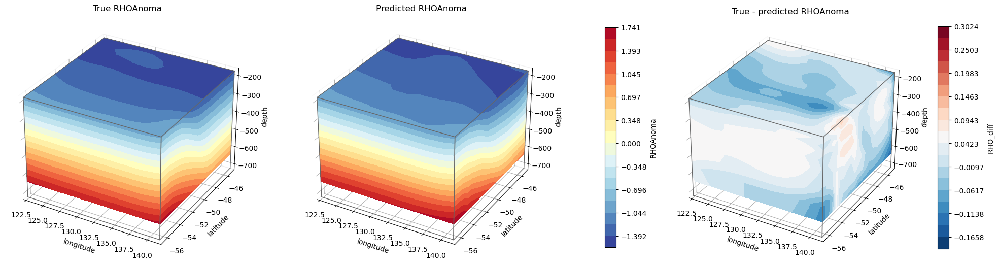

In [31]:
### TESTING THE PLOTTING FUNCTIONS
# make_a_quiver(inputs_val, char_val, lb_val, inputs_train, char_train, lb_train, u_pred, v_pred, w_pred)
make_a_cube(ds_model, 4)

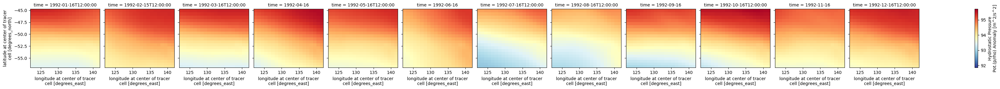

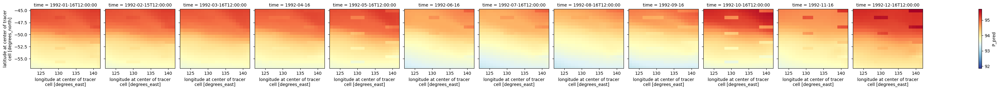

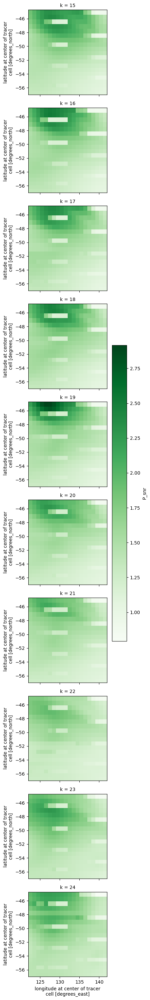

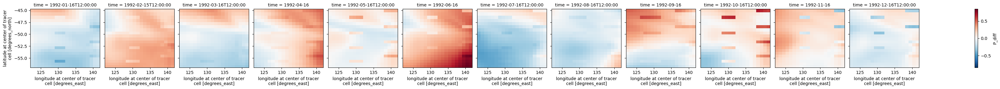

In [40]:
# make a mega plot of 4d data of zonal velocity

tags = [['EVEL', 'NVEL','WVELMASS_interp','PHIHYD','RHOAnoma'],
        ['UVEL_pred','VVEL_pred','WVELMASS_pred','P_pred','RHO_pred'],
        ['UVEL_diff','VVEL_diff','WVELMASS_diff','P_diff','RHO_diff'],
       ['UVEL_snr','VVEL_snr','WVELMASS_snr','P_snr','RHO_snr']]

output_type = 3
tag_true = tags[0][output_type]
tag_pred = tags[1][output_type]
tag_diff = tags[2][output_type]
tag_snr = tags[3][output_type]

chosen_depth=15
# # # each row of plots is a depth, each column is a time
vmin = min(ds_model[tag_true].min(),ds_model[tag_pred].min()).values
vmax = max(ds_model[tag_true].max(),ds_model[tag_pred].max()).values
ds_model[tag_true].isel(time=slice(*time_ind),k=chosen_depth-k_ind[0]).plot(x='XC', y='YC', col='time', cmap='RdYlBu_r', vmin=vmin, vmax=vmax)
ds_model[tag_pred].isel(time=slice(*time_ind),k=chosen_depth-k_ind[0]).plot(x='XC', y='YC', col='time', cmap='RdYlBu_r', vmin=vmin, vmax=vmax)
ds_model[tag_snr].plot(x='XC', y='YC', row='k',cmap='Greens')
ds_model[tag_diff].isel(time=slice(*time_ind),k=chosen_depth-k_ind[0]).plot(x='XC', y='YC', col='time')
plt.show()


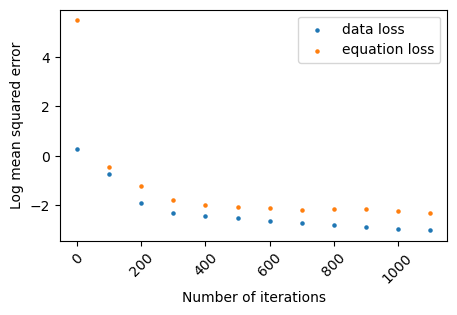

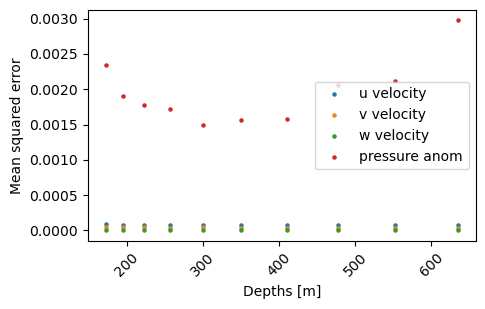

In [41]:
######## Losses after each iteration #######################
########           ########### 
fig, ax = plt.subplots(1, 1, figsize=(5,3))
iterations = list(range(0,len(data_losses)))
iterations = [i * 100 for i in iterations]
ax.scatter(iterations, np.log(data_losses), s = 5)
ax.scatter(iterations, np.log(eq_losses), s = 5)
ax.set_xlabel('Number of iterations')
ax.set_ylabel('Log mean squared error')
ax.legend(['data loss','equation loss'])
plt.xticks(rotation=45);


fig, ax = plt.subplots(1, 1, figsize=(5,3))
depths = -1*ds.Z.isel(k=slice(*k_ind))
# tags = [['EVEL','NVEL','WVELMASS_interp','PHIHYD','RHOAnoma'],
        # ['UVEL_diff','VVEL_diff','WVELMASS_diff','P_diff','RHO_diff']]
tags = [['EVEL','NVEL','WVELMASS_interp','RHOAnoma'],
    ['UVEL_diff','VVEL_diff','WVELMASS_diff','RHO_diff']]
for i in range(len(tags[1])): 
    throwaway = ds_model[tags[1][i]]#/ds_model[tags[0][i]] # diff/actual
    throwaway = throwaway*throwaway
    # throwaway = throwaway/ds_model[tags[0][i]] # RMPSE as percentage
    throwaway = throwaway.mean(['i','j','time'])
    ax.scatter(depths, throwaway, s = 5)
# ax.scatter(depths, ds_model['P_diff'].mean(['i','j','time']), s = 5)
# ax.scatter(depths, ds_model['RHO_diff'].mean(['i','j','time']), s = 5)
ax.set_xlabel('Depths [m]')
ax.set_ylabel('Mean squared error')
ax.legend(['u velocity','v velocity','w velocity','pressure anom', 'density anom'])
plt.xticks(rotation=45);

# fig, ax = plt.subplots(1, 1, figsize=(5,3))
# throwaway = ds_model['P_diff']*ds_model['P_diff']
# ax.scatter(depths, throwaway.mean(['i','j','time']), s = 5)
# throwaway = ds_model['RHO_diff']*ds_model['RHO_diff']
# ax.scatter(depths, throwaway.mean(['i','j','time']), s = 5)
# ax.set_xlabel('Depths [m]')
# ax.set_ylabel('Area- and time- MSE')
# ax.legend(['pressure anom', 'density anom'])
# plt.xticks(rotation=45);

# fig, ax = plt.subplots(1, 1, figsize=(5,3))
# iterations = list(range(0,len(data_losses)))
# ax.scatter(iterations, ds_model['U_PREDICTIONS'].isel(k=0,time=0).mean(['i','j']).squeeze(), s = 0.5)
# ax.set_xlabel('Number of iterations')
# ax.set_ylabel('Mean squared error')
# plt.xticks(rotation=45);

# # each of the NS terms
# fig, ax = plt.subplots(1, 1, figsize=(5,3))
# # iterations = list(range(0,nIter,10))
# iterations = list(range(0,len(eq_losses)))
# # ax.scatter(iterations, eq_losses)
# ax.scatter(iterations, ds_model['U_T'].isel(k=0,time=0).mean(['i','j']).squeeze(),s=0.5)
# ax.set_xlabel('Number of iterations')
# ax.set_ylabel('Mean squared error')
# # ax.set_ylim([0,1])
# plt.xticks(rotation=45);

# fig, ax = plt.subplots(1, 1, figsize=(5,3))
# # iterations = list(range(0,nIter,10))
# iterations = list(range(0,len(eq_losses)))
# # ax.scatter(iterations, eq_losses)
# ax.scatter(iterations, ds_model['UU_X'].isel(k=0,time=0).mean(['i','j']).squeeze(),s=0.5)
# ax.set_xlabel('Number of iterations')
# ax.set_ylabel('Mean squared error')
# # ax.set_ylim([0,1])
# plt.xticks(rotation=45);

# fig, ax = plt.subplots(1, 1, figsize=(5,3))
# # iterations = list(range(0,nIter,10))
# iterations = list(range(0,len(eq_losses)))
# # ax.scatter(iterations, eq_losses)
# ax.scatter(iterations, ds_model['VU_Y'].isel(k=0,time=0).mean(['i','j']).squeeze(),s=0.5)
# ax.set_xlabel('Number of iterations')
# ax.set_ylabel('Mean squared error')
# # ax.set_ylim([0,1])
# plt.xticks(rotation=45);

# fig, ax = plt.subplots(1, 1, figsize=(5,3))
# # iterations = list(range(0,nIter,10))
# iterations = list(range(0,len(eq_losses)))
# # ax.scatter(iterations, eq_losses)
# ax.scatter(iterations, ds_model['WU_Z'].isel(k=0,time=0).mean(['i','j']).squeeze(),s=0.5)
# ax.set_xlabel('Number of iterations')
# ax.set_ylabel('Mean squared error')
# # ax.set_ylim([0,1])
# plt.xticks(rotation=45);

# fig, ax = plt.subplots(1, 1, figsize=(5,3))
# # iterations = list(range(0,nIter,10))
# iterations = list(range(0,len(eq_losses)))
# # ax.scatter(iterations, eq_losses)
# ax.scatter(iterations, ds_model['FV'].isel(k=0,time=0).mean(['i','j']).squeeze(),s=0.5)
# ax.set_xlabel('Number of iterations')
# ax.set_ylabel('Mean squared error')
# # ax.set_ylim([0,1])
# plt.xticks(rotation=45);

# fig, ax = plt.subplots(1, 1, figsize=(5,3))
# # iterations = list(range(0,nIter,10))
# iterations = list(range(0,len(eq_losses)))
# # ax.scatter(iterations, eq_losses)
# ax.scatter(iterations, ds_model['P_X'].isel(k=0,time=0).mean(['i','j']).squeeze(),s=0.5)
# ax.set_xlabel('Number of iterations')
# ax.set_ylabel('Mean squared error')
# # ax.set_ylim([0,1])
# plt.xticks(rotation=45);


# #ax.set_aspect('equal', 'box')

In [95]:
ds.Z.isel(k=35)

<xarray.DataArray 'Z' ()>
array(-1765.135, dtype=float32)
Coordinates:
    k        int64 35
    Z        float32 -1.765e+03
    PHrefC   float32 1.732e+04
    drF      float32 139.1
Attributes:
    units:      m
    positive:   down
    long_name:  vertical coordinate of cell center

In [28]:
# # Create a figure with 6 subplot axes (for each face of the cube)
# # import plotly.subplots as sp
# from IPython.display import display

# x = np.linspace(0, 1, 20)
# y = np.linspace(0, 1, 20)
# z = np.linspace(0, 1, 20)
# t = np.linspace(0, 1, 20)

# # # Create a meshgrid for 3D plotting
# x, y, z, t = np.meshgrid(x, y, z, t)
# # t = 0*t

# fig = sp.make_subplots(
#     rows=2, cols=3,
#     specs=[[{'type': 'surface'}]*3]*2,
#     subplot_titles=['XY Plane', 'XZ Plane', 'YZ Plane', 'XT Plane', 'YT Plane', 'ZT Plane'],
#     horizontal_spacing=0.1, vertical_spacing=0.1
# )

# # Create 3D surface plots for each face
# fig.add_trace(go.Surface(x=x[:, :, 0], y=y[:, :, 0], z=z[:, :, 0], surfacecolor=t[:, :, 0], colorscale='Viridis', cmin=np.min(t), cmax=np.max(t)), row=1, col=1)
# fig.add_trace(go.Surface(x=x[:, 0, :], y=y[:, 0, :], z=z[:, 0, :], surfacecolor=t[:, 0, :], colorscale='Viridis', cmin=np.min(t), cmax=np.max(t)), row=1, col=2)
# fig.add_trace(go.Surface(x=x[0, :, :], y=y[0, :, :], z=z[0, :, :], surfacecolor=t[0, :, :], colorscale='Viridis', cmin=np.min(t), cmax=np.max(t)), row=1, col=3)
# fig.add_trace(go.Surface(x=x[:, :, -1], y=y[:, :, -1], z=z[:, :, -1], surfacecolor=t[:, :, -1], colorscale='Viridis', cmin=np.min(t), cmax=np.max(t)), row=2, col=1)
# fig.add_trace(go.Surface(x=x[:, -1, :], y=y[:, -1, :], z=z[:, -1, :], surfacecolor=t[:, -1, :], colorscale='Viridis', cmin=np.min(t), cmax=np.max(t)), row=2, col=2)
# fig.add_trace(go.Surface(x=x[-1, :, :], y=y[-1, :, :], z=z[-1, :, :], surfacecolor=t[-1, :, :], colorscale='Viridis', cmin=np.min(t), cmax=np.max(t)), row=2, col=3)

# # fig.write_html('4D_cube_heatmap.html')
# display(fig)

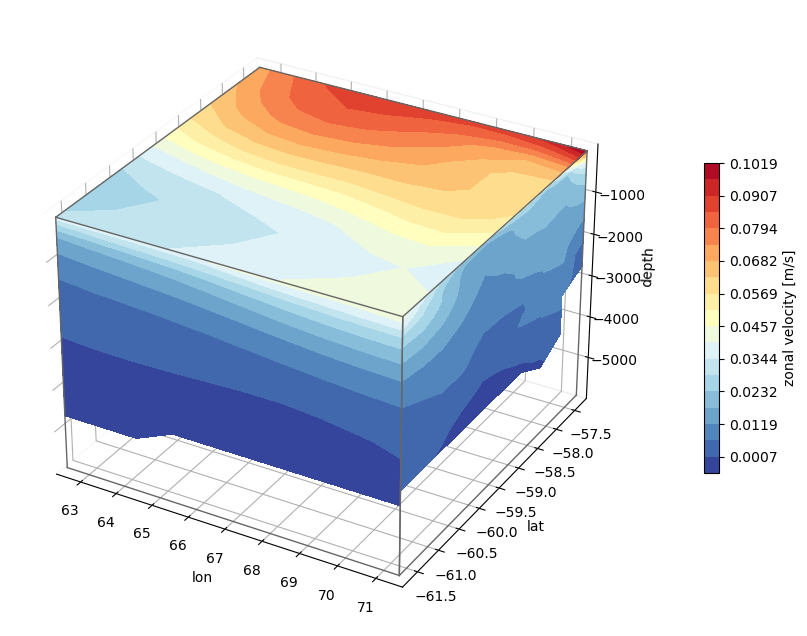

In [167]:
### 3D CUBE PLOT FOR THE OVERALL FIELD FROM DS (requires way more coordinates like j_ind etc.)

data = ds.EVEL.where(ds.maskC).isel(tile=tile_ind[0],time=0,i=slice(*i_ind), j=slice(*j_ind))
levels=np.linspace(data.min(), data.max(), 20)

seismic_nanmasked = plt.get_cmap('RdYlBu_r').copy()
seismic_nanmasked.set_bad('white')

# Create a figure with 3D ax
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# XY plot
ax.contourf(ds.XC.isel(tile=tile_ind[0],i=slice(*i_ind), j=slice(*j_ind)).values, ds.YC.isel(tile=tile_ind[0],i=slice(*i_ind), j=slice(*j_ind)).values, ds.EVEL.where(ds.maskC).isel(tile=tile_ind[0],time=0,k=k_ind[0],i=slice(*i_ind), j=slice(*j_ind)).values, zdir='z', offset=zmax, cmap=seismic_nanmasked, levels=levels)
# ax.contourf(ds.XC.isel(tile=4).values, ds.YC.isel(tile=4).values, ds.EVEL.where(ds.maskC).isel(tile=4,time=0,k=40).values, zdir='z', offset=ds.Z[40],cmap=seismic_nanmasked, levels=levels)

## XZ plot
ax.contourf(np.tile(ds.XC.isel(tile=tile_ind[0],i=slice(*i_ind),j=j_ind[0]),(k_ind[1]-k_ind[0],1)), ds.EVEL.where(ds.maskC).isel(tile=tile_ind[0],i=slice(*i_ind),j=j_ind[0],time=0).values, np.transpose(np.tile(ds.Z,(i_ind[1]-i_ind[0],1))), zdir='y', offset=ymin,cmap=seismic_nanmasked, levels=levels)
# ax.contourf(np.tile(ds.XC.isel(tile=4,j=-1),(50,1)), ds.EVEL.where(ds.maskC).isel(tile=4,j=-1,time=0).values, np.transpose(np.tile(ds.Z,(90,1))), zdir='y', offset=ymax,cmap=seismic_nanmasked, levels=levels)

## YZ plot
C = ax.contourf(ds.EVEL.where(ds.maskC).isel(tile=tile_ind[0],i=i_ind[1],j=slice(*j_ind),time=0).values, np.tile(ds.YC.isel(tile=tile_ind[0],i=i_ind[1],j=slice(*j_ind)),(k_ind[1]-k_ind[0],1)), np.transpose(np.tile(ds.Z,(j_ind[1]-j_ind[0],1))), zdir='x', offset=xmax,cmap=seismic_nanmasked, levels=levels)
# C = ax.contourf(ds.EVEL.where(ds.maskC).isel(tile=4,i=0,time=0).values, np.tile(ds.YC.isel(tile=4,i=0),(50,1)), np.transpose(np.tile(ds.Z,(90,1))), zdir='x', offset=xmin,cmap=seismic_nanmasked, levels=levels)


# #Set limits of the plot from coord limits
xmin, xmax = ds.XC.isel(tile=tile_ind[0],i=slice(*i_ind), j=j_ind[0]).min(), ds.XC.isel(tile=tile_ind[0],i=slice(*i_ind), j=j_ind[0]).max()
ymin, ymax = ds.YC.isel(tile=tile_ind[0],i=i_ind[1], j=slice(*j_ind)).min(), ds.YC.isel(tile=tile_ind[0],i=i_ind[1], j=slice(*j_ind)).max()
zmin, zmax = ds.Z.isel(k=k_ind[1]), ds.Z.isel(k=k_ind[0])
ax.set(xlim=[xmin, xmax], ylim=[ymin, ymax], zlim=[zmin, zmax])

# Plot edges
edges_kw = dict(color='0.4', linewidth=1, zorder=1e3)
ax.plot([xmax, xmax], [ymin, ymax], zmin, **edges_kw)
ax.plot([xmax, xmax], [ymin, ymax], zmax, **edges_kw)
ax.plot([xmin, xmax], [ymin, ymin], zmax, **edges_kw)
ax.plot([xmin, xmin], [ymin, ymax], zmax, **edges_kw)
ax.plot([xmin, xmax], [ymin, ymin], zmin, **edges_kw)
ax.plot([xmin, xmax], [ymax, ymax], zmax, **edges_kw)
ax.plot([xmin, xmin], [ymin, ymin], [zmin, zmax], **edges_kw)
ax.plot([xmax, xmax], [ymax, ymax], [zmin, zmax], **edges_kw)
ax.plot([xmax, xmax], [ymin, ymin], [zmin, zmax], **edges_kw)
ax.plot([xmax, xmax], [ymin, ymin], [zmin, zmax], **edges_kw)

# Set labels and zticks
ax.set(
    xlabel='lon',
    ylabel='lat',
    zlabel='depth',
)

# Set zoom and angle view
# ax.view_init(40, -30, 0)
# ax.set_box_aspect(None, zoom=0.9)

# Colorbar
fig.colorbar(C, ax=ax, fraction=0.02, pad=0.1, label='zonal velocity [m/s]')

# Show Figure
plt.show()